# Analysis of Foot players based on Fifa20 Video Game Data

## Problem Statement
Data Analysis on Atrributes and Skills of Football players on the basis of data available in Fifa20 Video Game.
Clustering Players on the basis of attributes and skills using Fifa 20 data 
Finding out top ten countries with most players 
Plotting the distribution of overall rating vs. Age of players. Interpret what is the age after which a player stops improving.
Which type of offensive players get paid the most: the striker, the right-winger, or the left-winger?

In [1]:
# Import the required libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Reading the given fifa20 dataset
data = pd.read_csv('players_20.csv')
data.shape

(18278, 104)

## Domain Analysis

**Short Description:**
>FIFA 20 Football is arguably the most popular sport in the world and FIFA is the most popular football (soccer) simulation game by Electronic Arts (EA Sports).
The dataset provided includes the players data for the Career Mode from FIFA 15 to FIFA 20 ("players_20.csv"). The data allows multiple comparisons of the same players across the last 6 versions of the videogame.



**Sources :**
>1. Fifa 20 Dataset       
2. https://sofifa.com/      
3. Google.com1      

## Basic Checks

In [3]:
# Checking The Size and Shape of The Data Provided
print(data.shape)
print(data.size)

(18278, 104)
1900912


Total 18,278 Rows and 104 Columns in the Dataset

In [4]:
#Checking fisrt 5 Rows
pd.set_option('display.max_columns', None) 
data.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7.0,NaN,2018-07-10,2022.0,LS,7.0,90.0,93.0,82.0,89.0,35.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10.0,NaN,2017-08-03,2022.0,LW,10.0,91.0,85.0,87.0,95.0,32.0,58.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,89.0,52.0,90.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,184500000.0,"#Speedster, #Dribbler, #Acrobat",LW,7.0,NaN,2019-07-01,

In [5]:
#Structure of The Dataset
data.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 104 columns):
 #    Column                      Non-Null Count  Dtype  
---   ------                      --------------  -----  
 0    sofifa_id                   18278 non-null  int64  
 1    player_url                  18278 non-null  object 
 2    short_name                  18278 non-null  object 
 3    long_name                   18278 non-null  object 
 4    age                         18278 non-null  int64  
 5    dob                         18278 non-null  object 
 6    height_cm                   18278 non-null  int64  
 7    weight_kg                   18278 non-null  int64  
 8    nationality                 18278 non-null  object 
 9    club                        18278 non-null  object 
 10   overall                     18278 non-null  int64  
 11   potential                   18278 non-null  int64  
 12   value_eur                   18278 non-null  int64  
 13   wage_eur      

In [6]:
#Description/Summary of the Dataset
data.describe()

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,release_clause_eur,team_jersey_number,contract_valid_until,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,18278.000000,1.698000e+04,18038.000000,18038.000000,1126.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,219738.864482,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,2.368038,4.740717e+06,20.103892,2021.114591,12.114565,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,49.718405,45.590218,52.221468,58.748003,42.809388,55.596509,47.325692,42.708885,52.768848,58.461976,64.299923,64.415746,63.504924,61.752544,63.856439,58.181694,64.928165,62.889485,65.234763,46.812945,55.742149,46.380239,50.072163,53.609749,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,27960.200461,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,0.765038,1.103002e+07,16.603639,1.289888,6.735922,11.297656,14.029418,10.407844,10.284950,16.419528,9.760162,7.736278,7.244023,7.510709,8.154062,10.634038,8.447876,18.325403,19.594609,17.428429,14.679653,17.701815,18.929118,18.422991,17.433612,15.246454,16.741878,15.042232,14.847763,14.808380,9.135613,14.201559,13.326083,11.934059,16.017954,12.534811,19.322343,17.318157,20.775812,19.594022,13.955626,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,768.000000,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,1.300000e+04,1.000000,2019.000000,1.000000,24.000000,15.000000,24.000000,23.000000,15.000000,27.000000,44.000000,42.000000,35.000000,45.000000,12.000000,41.000000,5.000000,2.000000,5.000000,7.000000,3.000000,4.000000,6.000000,4.000000,8.000000,5.000000,12.000000,11.000000,11.000000,21.000000,12.000000,14.000000,19.000000,12.000000,20.000000,4.000000,9.000000,3.000000,2.000000,9.000000,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,204445.500000,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,2.000000,5.630000e+05,9.000000,2020.000000,6.000000,61.000000,42.000000,50.000000,57.000000,36.000000,59.000000,60.000000,58.000000,57.000000,60.750000,29.000000,58.000000,38.000000,30.000000,44.000000,54.000000,30.000000,50.000000,34.000000,31.000000,43.000000,54.000000,56.000000,57.

## Data Cleaning and Manipulation

In [7]:
Team_Position = data[['team_position']]

In [8]:
data[['team_position']].mode()

,team_position
0,SUB


In [9]:
Team_Position = Team_Position.fillna('SUB')
Team_Position.isnull().sum()

team_position    0
dtype: int64

In [10]:
#Some of the columns are not important, so we can drop them.
redundant_columns = ['player_positions','sofifa_id','player_url','player_tags','long_name','dob','team_position',
                     'team_jersey_number','nation_jersey_number','nation_position','loaned_from','player_traits',
                     'work_rate','body_type','real_face','joined', 'contract_valid_until',
                     'gk_diving','gk_handling','gk_kicking','gk_reflexes','gk_speed','gk_positioning']
data = data.drop(redundant_columns, axis = 1)

In [11]:
BMI = pd.Series((data.weight_kg*10000)/(data.height_cm*data.height_cm))
data['BMI']= BMI
data.head()

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,BMI
0,L. Messi,32,170,72,Argentina,FC Barcelona,94,94,95500000,565000,Left,5,4,4,195800000.0,87.0,92.0,92.0,96.0,39.0,66.0,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2,24.913495
1,Cristiano Ronaldo,34,187,83,Portugal,Juventus,93,93,58500000,405000,Right,5,4,5,96500000.0,90.0,93.0,82.0,89.0,35.0,78.0,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,23.735308
2,Neymar Jr,27,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,Right,5,5,5,195200000.0,91.0,85.0,87.0,95.0,32.0,58.0,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3,22.204082
3,J. Oblak,26,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,Right,3,3,1,164700000.0,NaN,NaN,NaN,NaN,NaN,NaN,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.615211
4,E. Hazard,28,175,74,Belgium,Real Madrid,91,91,90000000,470000,Right,4,4,4,184500000.0,91.0,83.0,86.0,94.0,35.0,66.0,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83+3,83+3,83+3,89+3,88+3,88+3,88+3,89+3,89+3,89+3,89+3,89+3,83+3,83+3,83+3,89+3,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3,24.163265


In [12]:
data.shape

(18278, 82)

In [13]:
data =  pd.concat([data, Team_Position],axis = 1)

In [14]:
columns = ['ls','st','rs','lw','lf','cf','rf','rw','lam','cam','ram','lm','lcm','cm','rcm','rm','lwb',
           'ldm', 'cdm','rdm','rwb','lb','lcb','cb','rcb','rb']

In [15]:
data[columns].shape

(18278, 26)

In [16]:
for col in columns:
  data[col]=data[col].str.split('+',n=1,expand = True)[0]

data[columns]

,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63
1,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61
2,84,84,84,90,89,89,89,90,90,90,90,89,82,82,82,89,66,61,61,61,66,61,46,46,46,61
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,83,83,83,89,88,88,88,89,89,89,89,89,83,83,83,89,66,63,63,63,66,61,49,49,49,61
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,32,32,32,31,31,31,31,31,31,31,31,33,33,33,33,33,43,42,42,42,43,45,46,46,46,45
18274,33,33,33,33,32,32,32,33,33,33,33,35,36,36,36,35,44,43,43,43,44,46,47,47,47,46
18275,43,43,43,43,43,43,43,43,44,44,44,45,46,46,46,45,47,49,49,49,47,47,49,49,49,47
18276,43,43,43,45,44,44,44,45,46,46,46,46,46,46,46,46,48,48,48,48,48,48,49,49,49,48


In [17]:
data[columns] = data[columns].fillna(0)

In [18]:
data[columns] = data[columns].astype(int)

In [19]:
data.head()

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,BMI,team_position
0,L. Messi,32,170,72,Argentina,FC Barcelona,94,94,95500000,565000,Left,5,4,4,195800000.0,87.0,92.0,92.0,96.0,39.0,66.0,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63,24.913495,RW
1,Cristiano Ronaldo,34,187,83,Portugal,Juventus,93,93,58500000,405000,Right,5,4,5,96500000.0,90.0,93.0,82.0,89.0,35.0,78.0,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61,23.735308,LW
2,Neymar Jr,27,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,Right,5,5,5,195200000.0,91.0,85.0,87.0,95.0,32.0,58.0,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84,84,84,90,89,89,89,90,90,90,90,89,82,82,82,89,66,61,61,61,66,61,46,46,46,61,22.204082,CAM
3,J. Oblak,26,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,Right,3,3,1,164700000.0,NaN,NaN,NaN,NaN,NaN,NaN,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24.615211,GK
4,E. Hazard,28,175,74,Belgium,Real Madrid,91,91,90000000,470000,Right,4,4,4,184500000.0,91.0,83.0,86.0,94.0,35.0,66.0,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83,83,83,89,88,88,88,89,89,89,89,89,83,83,83,89,66,63,63,63,66,61,49,49,49,61,24.163265,LW


In [20]:
data.shape

(18278, 83)

In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 83 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   short_name                  18278 non-null  object 
 1   age                         18278 non-null  int64  
 2   height_cm                   18278 non-null  int64  
 3   weight_kg                   18278 non-null  int64  
 4   nationality                 18278 non-null  object 
 5   club                        18278 non-null  object 
 6   overall                     18278 non-null  int64  
 7   potential                   18278 non-null  int64  
 8   value_eur                   18278 non-null  int64  
 9   wage_eur                    18278 non-null  int64  
 10  preferred_foot              18278 non-null  object 
 11  international_reputation    18278 non-null  int64  
 12  weak_foot                   18278 non-null  int64  
 13  skill_moves                 182

## Exporatory Data Analysis

###  Univariate Analysis

#### 1) Top Ten Countries countributing the most players in the Fifa20 data.

In [22]:
Top_10_Countries =data.nationality.value_counts().head(10)

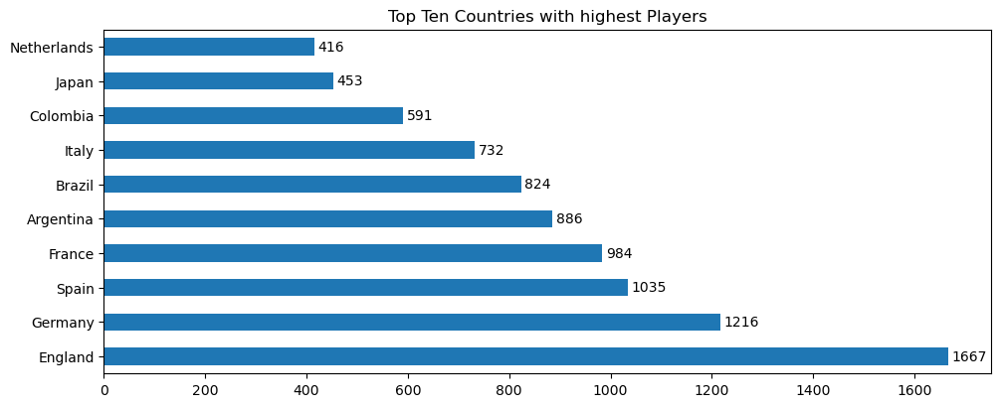

In [23]:
from matplotlib import rcParams
rcParams['figure.figsize'] = 11.5,4.5
ax=Top_10_Countries.plot(kind='barh', title='Top Ten Countries with highest Players')
for i in ax.containers:
    ax.bar_label(i, padding=2.5)

**Insights:**    
As shown in Figure A.1, England contributes the Most Playeers in Fifa 20 which is close to 10% of the total data.
Germany and Spain are the 2nd and 3rd Respectively. 
Here is the List of top 10 Countries with Number oof players along side.
  1. England    -- 1667
  2. Germany    -- 1216
  3. Spain      -- 1035
  4. France     --  984
  5. Argentina   -- 886
  6. Brazil      -- 824
  7. Italy       -- 732
  8. Colombia    -- 591
  9. Japan       -- 453
  10.Netherlands  -- 416

#### 2) Number of Players  according to  Different Features and Characteristics

>**Dribbling** notes ball control, agility and balance.
**Defending** notes tackling and marking.
**Physical** notes strength and stamina.
**Pace** notes the speed and the acceleration of the player.
**Passing** notes ability to successfully pass the ball with vision.
**Shooting** determines finishing skill and shot power.

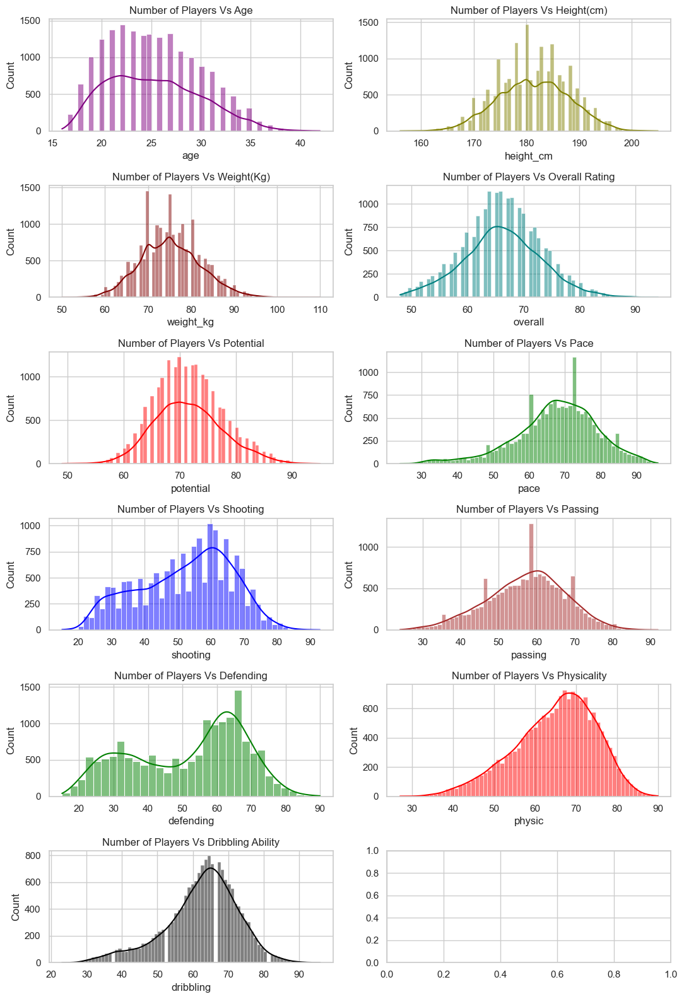

In [24]:
sns.set(style="whitegrid")  
fig,axs = plt.subplots(6,2, figsize = (11,16))
sns.histplot(data=data, x="age", kde=True, color="purple", ax=axs[0, 0]).set(title="Number of Players Vs Age")
sns.histplot(data=data, x="height_cm", kde=True, color="olive", ax=axs[0, 1]).set(title="Number of Players Vs Height(cm)")
sns.histplot(data=data, x="weight_kg", kde=True, color="maroon", ax=axs[1, 0]).set(title="Number of Players Vs Weight(Kg)")
sns.histplot(data=data, x="overall", kde=True, color="teal", ax=axs[1, 1]).set(title="Number of Players Vs Overall Rating")
sns.histplot(data=data, x="potential", kde=True, color="red", ax=axs[2, 0]).set(title="Number of Players Vs Potential")
sns.histplot(data=data, x="pace", kde=True, color="green", ax=axs[2, 1]).set(title="Number of Players Vs Pace")
sns.histplot(data=data, x="shooting", kde=True, color="blue", ax=axs[3, 0]).set(title="Number of Players Vs Shooting")
sns.histplot(data=data, x="passing", kde=True, color="brown", ax=axs[3, 1]).set(title="Number of Players Vs Passing ")
sns.histplot(data=data, x="defending", kde=True, color="green", ax=axs[4, 0]).set(title="Number of Players Vs Defending")
sns.histplot(data=data, x="physic", kde=True, color="red", ax=axs[4, 1]).set(title="Number of Players Vs Physicality")
sns.histplot(data=data, x="dribbling", kde=True, color="black", ax=axs[5, 0]).set(title="Number of Players Vs Dribbling Ability")
fig.tight_layout()

In [25]:
#Checking the data of Players above 40 years of age
Players_Above_40=data[data["age"] > 40].reset_index(drop=True)
Players_Above_40

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,BMI,team_position
0,G. Buffon,41,192,92,Italy,Juventus,83,83,2600000,58000,Right,4,2,1,4300000.0,NaN,NaN,NaN,NaN,NaN,NaN,13,15,13,37,17,26,20,13,35,28,37,30,55,80,49,56,71,34,69,13,38,28,12,50,22,70,13,11,11,78,77,74,91,80,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24.956597,SUB
1,Hilton,41,180,78,Brazil,Montpellier HSC,78,78,0,21000,Right,2,4,3,NaN,36.0,51.0,67.0,66.0,80.0,71.0,60,45,79,74,51,64,54,48,73,73,35,36,54,70,60,55,79,54,76,58,76,80,50,67,64,77,83,77,76,12,7,11,12,13,58,58,58,58,59,59,59,58,62,62,62,60,68,68,68,60,67,74,74,74,67,68,76,76,76,68,24.074074,CB
2,C. Lucchetti,41,182,69,Argentina,Atlético Tucumán,72,72,325000,5000,Right,1,3,1,488000.0,NaN,NaN,NaN,NaN,NaN,NaN,23,13,23,34,18,24,27,30,32,35,40,45,44,71,45,57,62,35,55,16,45,17,16,51,54,41,21,22,13,72,69,76,70,73,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,20.830818,GK
3,F. Kippe,41,194,97,Norway,Lillestrøm SK,65,65,0,1000,Left,1,3,2,NaN,25.0,52.0,49.0,34.0,61.0,73.0,33,46,70,56,43,24,51,53,55,49,24,25,27,66,31,70,44,37,93,52,76,63,40,49,62,64,62,58,55,14,9,10,6,11,51,51,51,40,45,45,45,40,45,45,45,41,50,50,50,41,48,58,58,58,48,50,63,63,63,50,25.773196,LCB
4,C. Muñoz,42,177,73,Argentina,CD Universidad de Concepción,64,64,50000,1000,Right,1,3,1,68000.0,NaN,NaN,NaN,NaN,NaN,NaN,25,15,13,36,12,22,19,20,34,31,53,56,33,62,58,50,73,29,65,20,35,25,16,45,24,62,18,14,19,64,63,66,64,61,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,23.301095,GK
5,H. Sulaimani,42,173,70,Saudi Arabia,Al Ahli,63,63,0,5000,Left,1,3,3,NaN,47.0,53.0,68.0,64.0,64.0,72.0,70,43,61,67,43,63,69,69,68,64,46,47,64,64,68,65,69,58,72,63,92,65,64,68,60,66,62,66,63,15,8,15,14,13,58,58,58,60,60,60,60,60,62,62,62,61,64,64,64,61,62,66,66,66,62,62,66,66,66,62,23.388687,LB


**Insights:**    
1) Number of Players vs Age: 
>Most of the players are between age 21 to 27. There is heavy decline in the   numbers after age 35.
From age 16 to 20, there is peak rise in number of players.
There seems to have only six players in 41 and 42 age category. Three out of them are Goalkeepeers.
  
  
2) Number of Players Vs Height
> 180 cm is the most common height. Most of the players' height ranges between 175cm to 185 cm.


3) Number of Players Vs Weight 
>70 to 80 kg of weight is the most common among the players.

4) Number of Players Vs Overall Ratings
> Most of the players fall between 60 to 70 overall rating. There is considerable decline in number after 70. A very few players fall above 85 overall rating.

5) Number of Players Vs Potential
> Most of the players have potential around 70. There seems to have steady growth before 70 and steady decline after 70. A few players have potential above 85.

6) Number of Players Vs Pace
>Most of the players fall wthin 65 to 75 pace ratings. Number of players decline after 75.

7) Number of Players Vs Shooting Ability
>Most of the players fall within 55 to 65 Shooting ability. There is steep decline in numbers after 65. A few players have been given shooting ability ratings above 80.

8) Number of Players Vs Passing Ability
>Most of the players have passing ability of 60. 

9) Number of Players Vs Defending Ability
> After the steady rise from 20 to 30, there seems to be decline in upto 55 and again after 55, there is steep rise. Most of the players fall between 55 to 75 ratings.

10) Number of Players Vs Physicality (Strength and Stamina)
> Most of the players have physicality of around 70. With the steady rise in the count from 40 to 70, it falls steeply after 70. Their are veru less players with  physical ability of more than 85. 

11) Number of Players Vs Dribbling ability
> Most of the players have Dribbling ability between 60 and 70 as shown in the graph.


#### 3) Number of Players with their Team Postion

Team Position is the Unique position on the pitch ,for eg Striker, Centre Attacking Midfielder, Centre Back, etc which players have according to their Skills and Role in the team.
>Attackers: ST, RS, LS, LW, RW, CF, RF, LF

>Midfielders: CAM, LM, CM, RM, CDM, LAM, RAM, LDM, RDM, RCM, LCM

>Defenders: LCB, RCB, LB, RB, CB, RWB, LWB

>Goalkeepers: GK

>Substitutes: SUB

>Reserved Players: RES


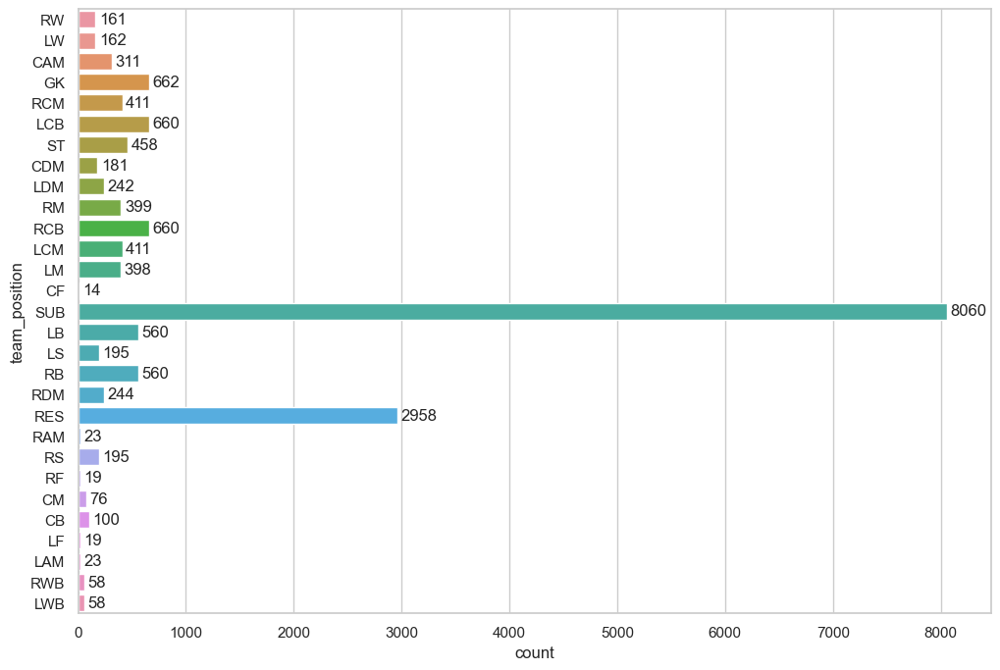

In [26]:
#Count Plot for Team Position
from matplotlib import rcParams
rcParams['figure.figsize'] = 12,8
ax = sns.countplot(y='team_position', data=data)
for i in ax.containers:
    ax.bar_label(i, padding=2.5)

**Insights:**     
Most of the players are Substitutes(SUB), their number is 7820. 
Then there are Reserved 2958 players (RES)

There are 662 Goalkeepers in the Dataset.

Number of Attackers
>RW(161), LW(162), ST(458), RS(195), LS(195), CF(14), RF(19), LF(19) are all attackers and They are 1,223 in Total

Number of Midfielders
>CAM(311), RCM(411), CDM(181), LDM(242), RM(399), LM(398), LCM(411), RDM(244), RAM(23), CM(76), LAM(23), are all midfielders. They are 2,719 in Total

Number of Defenders
>LCB(660), RCB(660), LB(560), RB(560), CB(100), RWB(58), LWB(58) are all Midfielders and their total Number is 2,656



#### 4) Number of Players according to International Reputation, Ability Skill Moves Abilty and Ability to play with Weak Foot

In [27]:
print(data['international_reputation'].value_counts(sort=False))
print(data['weak_foot'].value_counts(sort=False))
print(data['skill_moves'].value_counts(sort=False))

5        6
3      292
4       46
2     1140
1    16794
Name: international_reputation, dtype: int64
4     2666
5      245
3    11347
2     3865
1      155
Name: weak_foot, dtype: int64
4    1040
5      49
1    2036
2    8617
3    6536
Name: skill_moves, dtype: int64


[Text(0.5, 1.0, 'Weak Foot: 1 to 5 stars')]

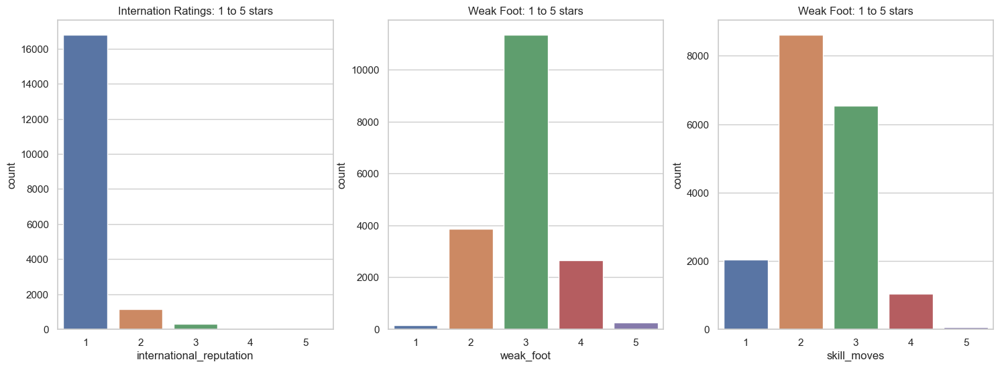

In [28]:
fig, ax = plt.subplots(1,3, figsize=(18, 6))
sns.countplot(x='international_reputation', data=data, ax=ax[0]).set(title='Internation Ratings: 1 to 5 stars')
sns.countplot(x='weak_foot', data=data, ax=ax[1]).set(title='Weak Foot: 1 to 5 stars')
sns.countplot(x='skill_moves', data=data, ax=ax[2]).set(title='Weak Foot: 1 to 5 stars')       


In [29]:
#List of Players with 5 International Reputation Rationgs
Players_5IR=data[data['international_reputation']==5].reset_index(drop=True)
Players_5IR.index+=1
Players_5IR

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,BMI,team_position
1,L. Messi,32,170,72,Argentina,FC Barcelona,94,94,95500000,565000,Left,5,4,4,195800000.0,87.0,92.0,92.0,96.0,39.0,66.0,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63,24.913495,RW
2,Cristiano Ronaldo,34,187,83,Portugal,Juventus,93,93,58500000,405000,Right,5,4,5,96500000.0,90.0,93.0,82.0,89.0,35.0,78.0,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61,23.735308,LW
3,Neymar Jr,27,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,Right,5,5,5,195200000.0,91.0,85.0,87.0,95.0,32.0,58.0,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84,84,84,90,89,89,89,90,90,90,90,89,82,82,82,89,66,61,61,61,66,61,46,46,46,61,22.204082,CAM
4,L. Suárez,32,182,86,Uruguay,FC Barcelona,89,89,53000000,355000,Right,5,4,3,108700000.0,73.0,89.0,80.0,84.0,51.0,84.0,78,91,83,82,90,85,86,82,72,84,76,70,79,92,79,88,69,82,86,86,87,41,92,82,83,85,57,45,38,27,25,31,33,37,86,86,86,83,85,85,85,83,84,84,84,82,79,79,79,82,67,67,67,67,67,64,63,63,63,64,25.963048,ST
5,M. Neuer,33,193,92,Germany,FC Bayern München,88,88,32000000,155000,Right,5,4,1,52800000.0,NaN,NaN,NaN,NaN,NaN,NaN,15,13,25,55,11,30,14,11,59,46,54,60,51,84,35,68,77,43,80,16,29,30,12,70,47,70,17,10,11,87,87,91,85,87,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24.698650,GK
6,Z. Ibrahimović,37,195,95,Sweden,LA Galaxy,85,85,14000000,15000,Right,5,4,5,21000000.0,56.0,88.0,77.0,77.0,34.0,78.0,70,86,83,77,88,77,80,78,73,84,57,55,72,82,39,90,68,59,87,88,84,20,91,84,89,90,28,37,24,13,15,10,9,12,82,82,82,77,80,80,80,77,80,80,80,75,74,74,74,75,53,57,57,57,53,50,52,52,52,50,24.983563,ST


**Insights:**
> 1. There are only few players with 4 to 5 stars Reputation in the given data. As shown in above graph, only 6 Players have 5 star Rating. Most of the players are not recognised internationally.
Above data shows the List of 6 Players with 5 star Ratings. They are 1) Lionel Messi, 2) Christiano Ronaldo, 3) Neymar Jr, 4) L. Saurez, 5) M. Neuer, and 6) Z. Ibrahimovic


> 2. Most of the players are rated 3 Stars in Weak Foot Ratings. There are only 245 players with 5 star ratings in Weak Foot ability

> 3. In Skill Moves Rating, most of the players fall in 2 and # Stars (close to 80%). Only 49 players have 5 Star skill moves ratings

#### 5) Number of Players with Left vs Right Preferred Foot

In [30]:
print(data['preferred_foot'].value_counts(sort=False)/182.78)

Left     23.624029
Right    76.375971
Name: preferred_foot, dtype: float64


[Text(0.5, 1.0, 'Number of Players with Left vs Right preferred foot')]

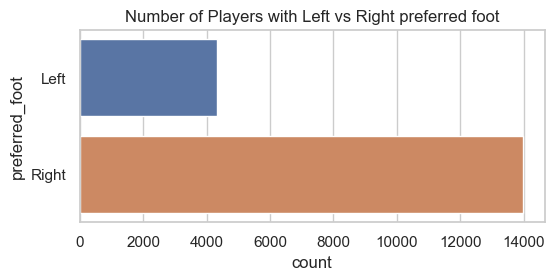

In [31]:
from matplotlib import rcParams
rcParams['figure.figsize'] = 6,2.5
sns.countplot(y='preferred_foot', data=data).set(title='Number of Players with Left vs Right preferred foot') 

**Insights:**   
> Most of the Players are Right Footed. Aroung 76% players have Right preferred Foot. Remaining 24% preferr Left Foot.

#### 6) Numbers of Players according to their Wages and Effect of International reputation on it (First 2000 players)

[Text(0.5, 1.0, 'KDE plot for Wages of Players')]

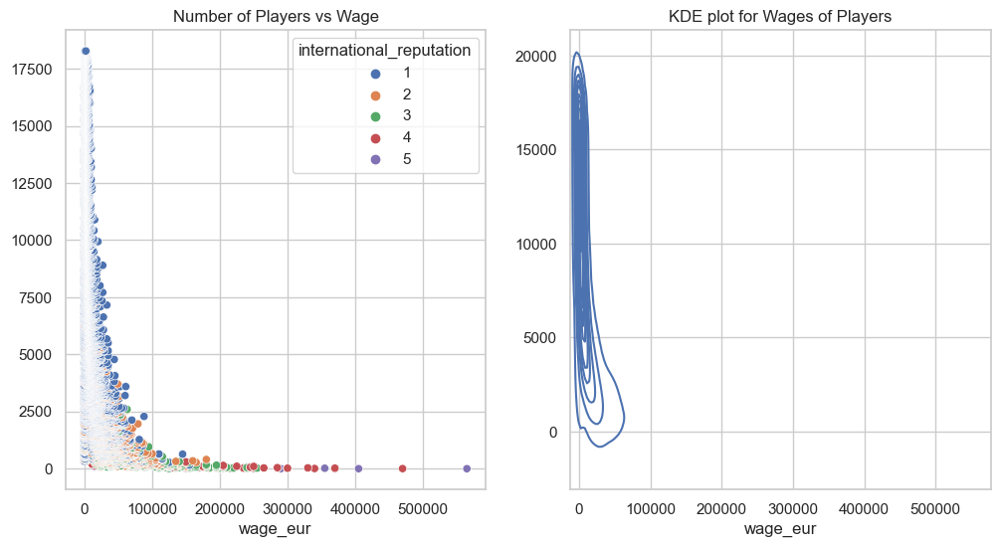

In [32]:
fig, ax = plt.subplots(1,2, figsize=(12, 6))
sns.scatterplot(data=data, x='wage_eur', y=data.index, hue='international_reputation', palette="deep",ax=ax[0]).set(title='Number of Players vs Wage')
sns.kdeplot(data=data, x='wage_eur', y=data.index, ax=ax[1]).set(title='KDE plot for Wages of Players')

In [33]:
Top_5_Earning_players = data.sort_values("wage_eur", axis = 0, ascending = False)[['short_name', 'wage_eur', 'international_reputation','club', 'nationality','age','potential']].head().reset_index(drop=True)
Top_5_Earning_players.index+=1
Top_5_Earning_players

,short_name,wage_eur,international_reputation,club,nationality,age,potential
1,L. Messi,565000,5,FC Barcelona,Argentina,32,94
2,E. Hazard,470000,4,Real Madrid,Belgium,28,91
3,Cristiano Ronaldo,405000,5,Juventus,Portugal,34,93
4,K. De Bruyne,370000,4,Manchester City,Belgium,28,91
5,A. Griezmann,370000,4,FC Barcelona,France,28,89


**Insights:**     
> Most of the players have Wages below 100,000 Euros. As shown in the first graph, blue and orange dots are more apparent on this category. It shows that International reputation heavily affects the Wages of players.

>There are very less number of players with wages above 100,000 Euros.

> Players with international reputation of 4 and 5 stars grab heigher wages.

>Lionel Messi has the heighest wages of 565,000 Euros

#### 7) Density of Body Mass Indes of Players

[Text(0.5, 1.0, '2D Kde Plot of BMI')]

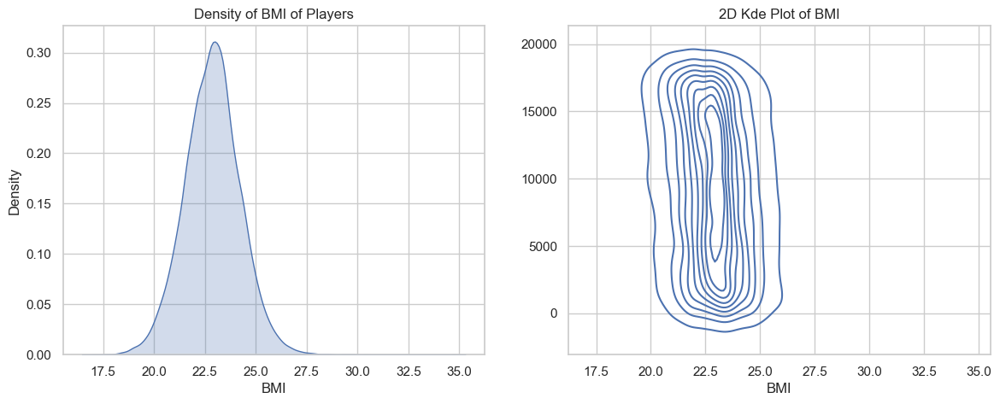

In [34]:
fig, ax = plt.subplots(1,2, figsize=(14, 5))
sns.kdeplot(data=data, x="BMI", shade=True, ax=ax[0]).set(title='Density of BMI of Players')
sns.kdeplot(data=data, x="BMI", y=data.index, ax=ax[1]).set(title='2D Kde Plot of BMI')

**Insights:**   
>Most of the players fall 22.5 to 23.5 Body Mass Index which is Ideal for Male Body

>Mean of The BMI is 22.85

###  Bivariate Analysis

#### 1) Effect of Age on Player's Overall Rating and Potential

[Text(0.5, 1.0, 'Age vs Potential')]

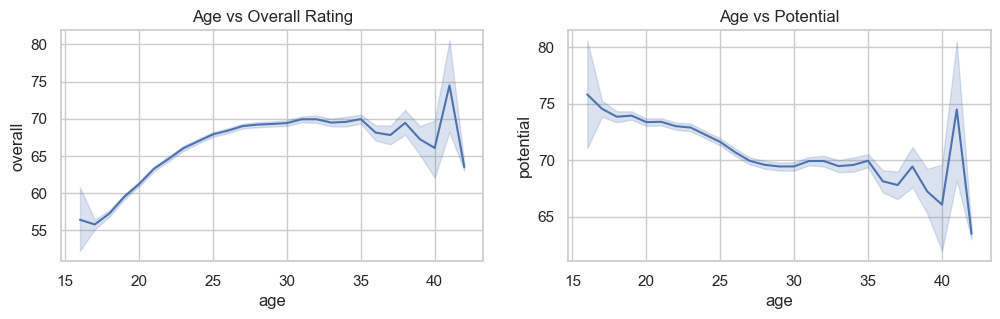

In [35]:
fig, ax = plt.subplots(1,2, figsize=(12, 3))
sns.lineplot('age','overall',data=data,  ax=ax[0]).set(title='Age vs Overall Rating')
sns.lineplot('age', 'potential', data=data, ax=ax[1]).set(title='Age vs Potential')


In [36]:
Players_Above_40=data[data["age"] > 40].reset_index(drop=True)
Players_Above_40

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,BMI,team_position
0,G. Buffon,41,192,92,Italy,Juventus,83,83,2600000,58000,Right,4,2,1,4300000.0,NaN,NaN,NaN,NaN,NaN,NaN,13,15,13,37,17,26,20,13,35,28,37,30,55,80,49,56,71,34,69,13,38,28,12,50,22,70,13,11,11,78,77,74,91,80,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24.956597,SUB
1,Hilton,41,180,78,Brazil,Montpellier HSC,78,78,0,21000,Right,2,4,3,NaN,36.0,51.0,67.0,66.0,80.0,71.0,60,45,79,74,51,64,54,48,73,73,35,36,54,70,60,55,79,54,76,58,76,80,50,67,64,77,83,77,76,12,7,11,12,13,58,58,58,58,59,59,59,58,62,62,62,60,68,68,68,60,67,74,74,74,67,68,76,76,76,68,24.074074,CB
2,C. Lucchetti,41,182,69,Argentina,Atlético Tucumán,72,72,325000,5000,Right,1,3,1,488000.0,NaN,NaN,NaN,NaN,NaN,NaN,23,13,23,34,18,24,27,30,32,35,40,45,44,71,45,57,62,35,55,16,45,17,16,51,54,41,21,22,13,72,69,76,70,73,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,20.830818,GK
3,F. Kippe,41,194,97,Norway,Lillestrøm SK,65,65,0,1000,Left,1,3,2,NaN,25.0,52.0,49.0,34.0,61.0,73.0,33,46,70,56,43,24,51,53,55,49,24,25,27,66,31,70,44,37,93,52,76,63,40,49,62,64,62,58,55,14,9,10,6,11,51,51,51,40,45,45,45,40,45,45,45,41,50,50,50,41,48,58,58,58,48,50,63,63,63,50,25.773196,LCB
4,C. Muñoz,42,177,73,Argentina,CD Universidad de Concepción,64,64,50000,1000,Right,1,3,1,68000.0,NaN,NaN,NaN,NaN,NaN,NaN,25,15,13,36,12,22,19,20,34,31,53,56,33,62,58,50,73,29,65,20,35,25,16,45,24,62,18,14,19,64,63,66,64,61,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,23.301095,GK
5,H. Sulaimani,42,173,70,Saudi Arabia,Al Ahli,63,63,0,5000,Left,1,3,3,NaN,47.0,53.0,68.0,64.0,64.0,72.0,70,43,61,67,43,63,69,69,68,64,46,47,64,64,68,65,69,58,72,63,92,65,64,68,60,66,62,66,63,15,8,15,14,13,58,58,58,60,60,60,60,60,62,62,62,61,64,64,64,61,62,66,66,66,62,62,66,66,66,62,23.388687,LB


**Insights:**    
> With increase in Age  their is steady rise in Overall Ratings till the age 30. From 30 to 35, it remains constant and thein starts to decline after 35. The Peak above that is shown in the graph is beacuse there are only 4 players aged 41 who have higher ratings.

> With increase in age, the potential seems to be decreasing mildly upto age 35. After age 35, is decreases significantlty. The exception at 41 is beacuse there are only 4 players, out of whom 2 players have above 90 Potential.

#### 2) Analysing Potential Ratings according to Skill Moves Ability & Weak Foot and Impact of Potential on International Reputation


[Text(0.5, 1.0, 'International Reputation Vs Potential')]

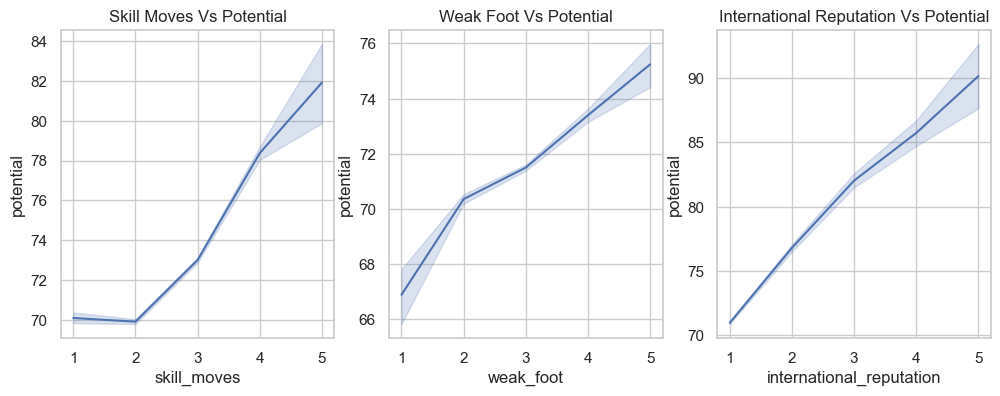

In [37]:
fig, ax = plt.subplots(1,3, figsize=(12, 4))
sns.lineplot(x="skill_moves", y='potential', data=data, ax=ax[0]).set(title='Skill Moves Vs Potential')
sns.lineplot(x="weak_foot", y='potential', data=data, ax=ax[1]).set(title='Weak Foot Vs Potential')
sns.lineplot(x="international_reputation", y='potential',data=data, ax=ax[2]).set(title='International Reputation Vs Potential')

**Insights:**     

>Having Skill Moves ability affects Potentail Rating Postively. It Steeply rises with Skill Moves ability
Alike Skill moves, ability to play with Weak foot also affects Potential postively.

> Having heigher Potential affects International Reputation postively. Players with potential above 85 are more internationally recognised.

#### 3) Effect of Age, Height and Weight on the Pace Rating of Players

[Text(0.5, 1.0, 'Weight(kg) Vs Pace')]

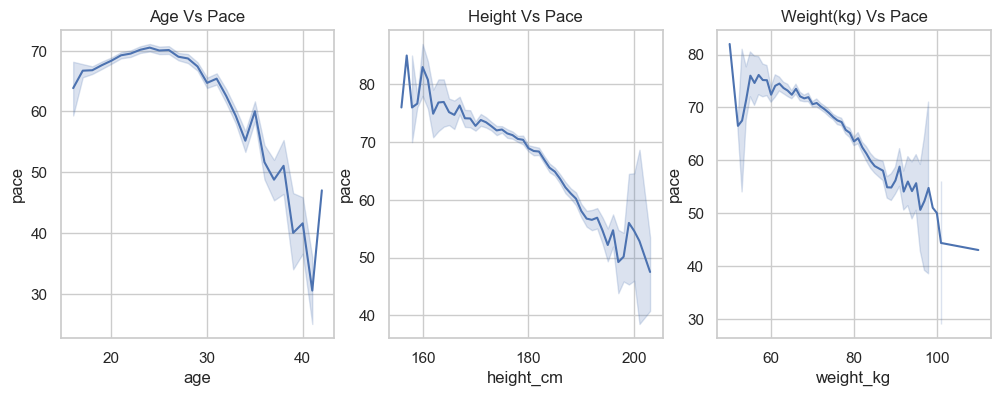

In [38]:
fig, ax = plt.subplots(1,3, figsize=(12, 4))
sns.lineplot(x="age", y='pace', data=data, ax=ax[0]).set(title='Age Vs Pace')
sns.lineplot(x="height_cm", y='pace',data=data, ax=ax[1]).set(title='Height Vs Pace')
sns.lineplot(x="weight_kg", y='pace', data=data, ax=ax[2]).set(title='Weight(kg) Vs Pace')

**Insights:**    
> With increasing Age, Pace shows steep decline in Pace of player 

> Tall players seems to have low pace ratings as compared to short players. With increase in height, pace rating is decreasing.

> Like height, heigher Weight is also affecting pace negatively 

#### 4) Effect of Age on Acceleration, Agility and Sprint Speed of the Player.

[Text(0.5, 1.0, 'Age Vs Sprint Speed')]

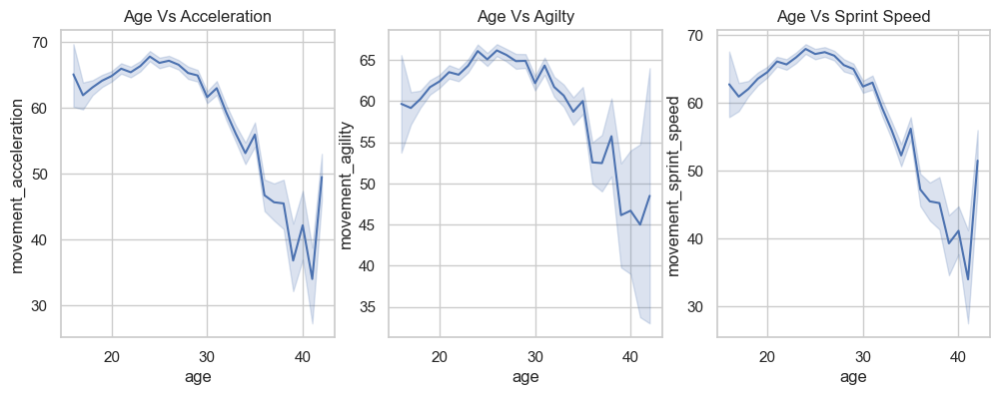

In [39]:
fig, ax = plt.subplots(1,3, figsize=(12, 4))
sns.lineplot(x="age", y='movement_acceleration', data=data, ax=ax[0]).set(title='Age Vs Acceleration')
sns.lineplot(x="age", y='movement_agility', data=data, ax=ax[1]).set(title='Age Vs Agilty')
sns.lineplot(x="age", y='movement_sprint_speed', data=data, ax=ax[2]).set(title='Age Vs Sprint Speed')

**Insights:**  

> Age affects Acceleration, Agility and Sprint speed alike in a Negative direction. All three graphs show steep decline with increasing age. There is exception at 41 years of age because of the data of only 4 players, which can be neglected.

#### 5) Which type of offensive players tends to get paid the most: the striker, the right-winger, or the left-winger? 

In [40]:
# Seperating the Data of Strikers (ST), the Right Wingers(RW) and Left Wingers (LW)
RW=data[data["team_position"] == 'RW']
LW=data[data["team_position"] == 'LW']
ST=data[data["team_position"] == 'ST']
Offensive_list=[RW,ST,LW]  
OP_1=pd.concat(Offensive_list).reset_index(drop=True)  

OP_2= OP_1[['short_name','team_position', 'wage_eur']].sort_values(by='wage_eur', ascending=False).reset_index(drop=True)
OP=OP_2.groupby(by='team_position', as_index=False)
OP.count()

,team_position,short_name,wage_eur
0,LW,162,162
1,RW,161,161
2,ST,458,458


In [41]:
OP.sum()

,team_position,wage_eur
0,LW,3776000
1,RW,3385000
2,ST,7535000


In [42]:
#Average Wage of Offensive Players according to their Postion
Avg_Wage_OP =pd.DataFrame(OP.mean())
Avg_Wage_OP.rename(columns = {"wage_eur":"Average Wage"},  inplace=True)
Avg_Wage_OP.index+=1
Avg_Wage_OP

,team_position,Average Wage
1,LW,23308.641975
2,RW,21024.844720
3,ST,16451.965066


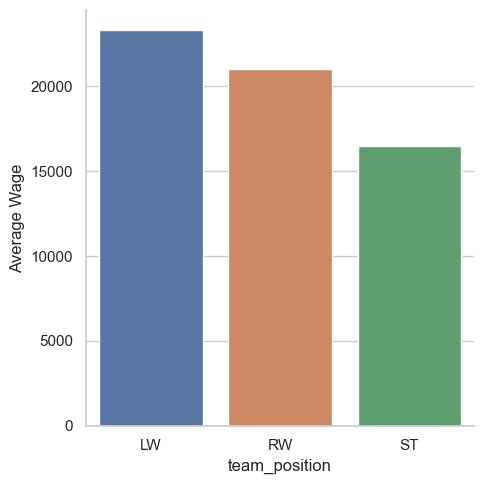

In [43]:
sns.catplot(data=Avg_Wage_OP, x="team_position", y="Average Wage", kind="bar")

**Conclusion:**

> Out of Three types of Offensive Players, Left Wingers are paid the Most with average earning of 23,309 Euros. 

> Right Wingers are at the 2nd place with average earning of 21,025 Euros and Strikers come at 3rd place with average earning of 16,452 Euros

**6) Potential Vs Wages Earned in Euros**

Text(0, 0.5, 'Wages')

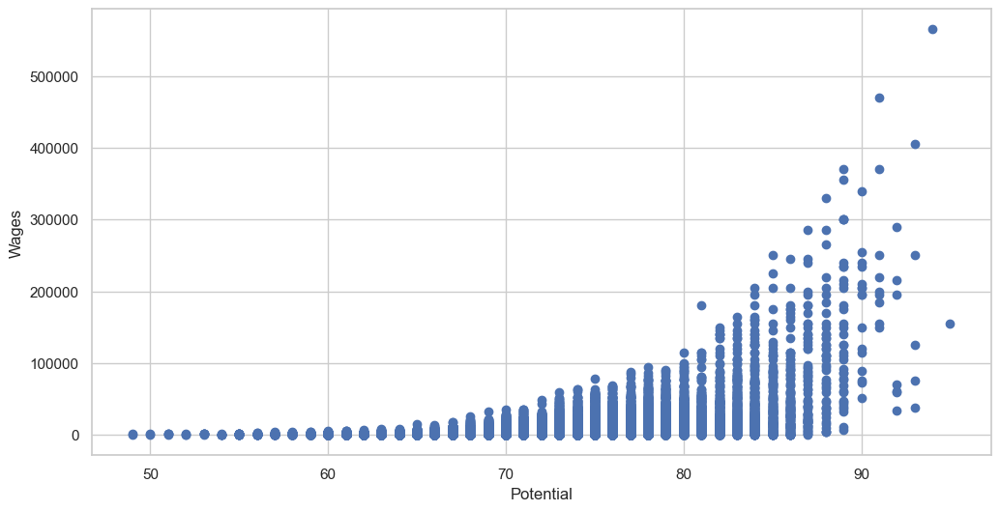

In [44]:
plt.figure(figsize=(12,6))
plt.scatter(data.potential, data.wage_eur)
plt.xlabel('Potential')
plt.ylabel('Wages')

**Insights:**

> With increase in Potential upto 70, there is only moderate increase in wages

> After 70 potential, there is considerable jump in wages of players

###  Multivariate Analysis

#### Co-relation between Attributes and Skills For Field Players

<AxesSubplot:>

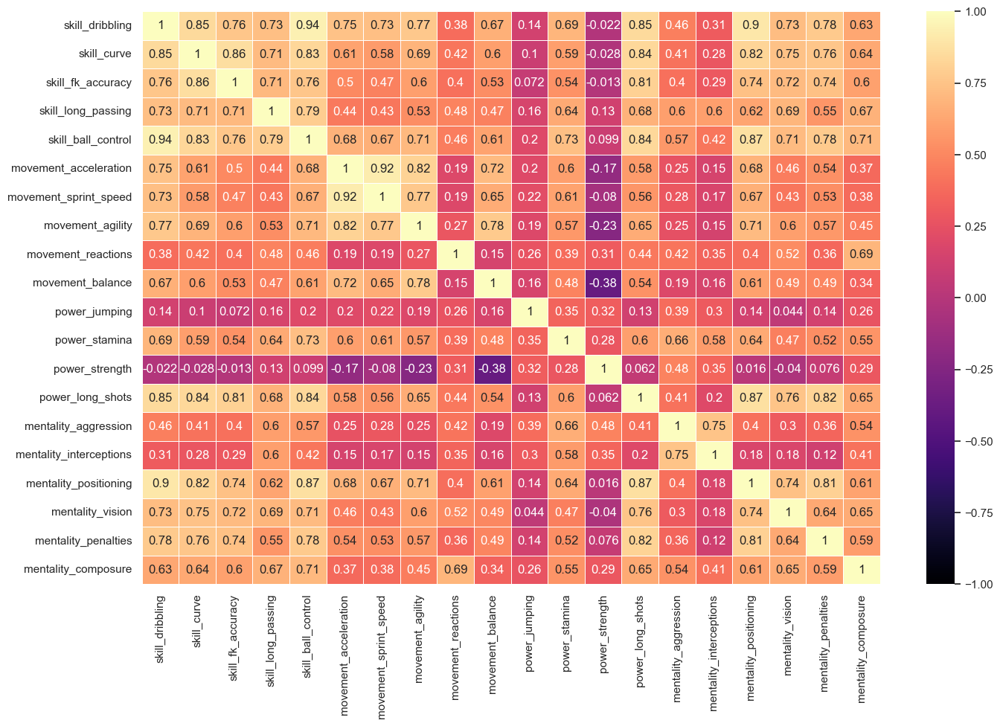

In [45]:
plt.figure(figsize= (16,10))
sns.heatmap(data = data[['skill_dribbling', 'skill_curve', 'skill_fk_accuracy','skill_long_passing',
                         'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 
                         'movement_agility', 'movement_reactions', 'movement_balance',
                         'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
                         'mentality_aggression', 'mentality_interceptions', 'mentality_positioning',
                         'mentality_vision', 'mentality_penalties', 'mentality_composure']].corr(), annot = True,  cmap = "magma" , vmin = -1, vmax = 1, center=0, linewidth=.5)

**Insights from Field Players' Data**

Only three variables seems to have strong correlation.
> 1. Skill Ball Control and Skill Dribbling

> 2. Mentality Position and Skill Dribbling

> 3. Movement Acceleration and Movement Sprint Speed

Some of the variables have reasonable correlation between them. 

> 1. Power long Shot and Skill Dribbling. 

> 2. Skill Dribbling and Skill Curve

> 3. Skill Curve and Skill Freekick accuracy

> 4. Mentality Position and Skill ball control

> 5. Mentality Position and Power long shots

#### Co-relation between Attributes and Skills For Goalkeepers

## Data Preprocessing

In [46]:
data.head()

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,BMI,team_position
0,L. Messi,32,170,72,Argentina,FC Barcelona,94,94,95500000,565000,Left,5,4,4,195800000.0,87.0,92.0,92.0,96.0,39.0,66.0,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63,24.913495,RW
1,Cristiano Ronaldo,34,187,83,Portugal,Juventus,93,93,58500000,405000,Right,5,4,5,96500000.0,90.0,93.0,82.0,89.0,35.0,78.0,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61,23.735308,LW
2,Neymar Jr,27,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,Right,5,5,5,195200000.0,91.0,85.0,87.0,95.0,32.0,58.0,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84,84,84,90,89,89,89,90,90,90,90,89,82,82,82,89,66,61,61,61,66,61,46,46,46,61,22.204082,CAM
3,J. Oblak,26,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,Right,3,3,1,164700000.0,NaN,NaN,NaN,NaN,NaN,NaN,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24.615211,GK
4,E. Hazard,28,175,74,Belgium,Real Madrid,91,91,90000000,470000,Right,4,4,4,184500000.0,91.0,83.0,86.0,94.0,35.0,66.0,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83,83,83,89,88,88,88,89,89,89,89,89,83,83,83,89,66,63,63,63,66,61,49,49,49,61,24.163265,LW


In [47]:
data_model= data.drop(['short_name','nationality','club','release_clause_eur'], axis=1)

In [48]:
data_model.head()

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,BMI,team_position
0,32,170,72,94,94,95500000,565000,Left,5,4,4,87.0,92.0,92.0,96.0,39.0,66.0,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63,24.913495,RW
1,34,187,83,93,93,58500000,405000,Right,5,4,5,90.0,93.0,82.0,89.0,35.0,78.0,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61,23.735308,LW
2,27,175,68,92,92,105500000,290000,Right,5,5,5,91.0,85.0,87.0,95.0,32.0,58.0,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84,84,84,90,89,89,89,90,90,90,90,89,82,82,82,89,66,61,61,61,66,61,46,46,46,61,22.204082,CAM
3,26,188,87,91,93,77500000,125000,Right,3,3,1,NaN,NaN,NaN,NaN,NaN,NaN,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24.615211,GK
4,28,175,74,91,91,90000000,470000,Right,4,4,4,91.0,83.0,86.0,94.0,35.0,66.0,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83,83,83,89,88,88,88,89,89,89,89,89,83,83,83,89,66,63,63,63,66,61,49,49,49,61,24.163265,LW


In [49]:
data_model[['preferred_foot', 'team_position']]

,preferred_foot,team_position
0,Left,RW
1,Right,LW
2,Right,CAM
3,Right,GK
4,Right,LW
...,...,...
18273,Right,RES
18274,Right,SUB
18275,Right,SUB
18276,Right,SUB


In [50]:
from sklearn.preprocessing import LabelEncoder
lb = LabelEncoder()
data_model['preferred_foot'] = lb.fit_transform(data_model['preferred_foot'])
data_model['team_position'] = lb.fit_transform(data_model['team_position'])

In [51]:
data_model.head()

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,BMI,team_position
0,32,170,72,94,94,95500000,565000,0,5,4,4,87.0,92.0,92.0,96.0,39.0,66.0,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63,24.913495,25
1,34,187,83,93,93,58500000,405000,1,5,4,5,90.0,93.0,82.0,89.0,35.0,78.0,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61,23.735308,14
2,27,175,68,92,92,105500000,290000,1,5,5,5,91.0,85.0,87.0,95.0,32.0,58.0,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84,84,84,90,89,89,89,90,90,90,90,89,82,82,82,89,66,61,61,61,66,61,46,46,46,61,22.204082,0
3,26,188,87,91,93,77500000,125000,1,3,3,1,NaN,NaN,NaN,NaN,NaN,NaN,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24.615211,5
4,28,175,74,91,91,90000000,470000,1,4,4,4,91.0,83.0,86.0,94.0,35.0,66.0,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83,83,83,89,88,88,88,89,89,89,89,89,83,83,83,89,66,63,63,63,66,61,49,49,49,61,24.163265,14


<AxesSubplot:>

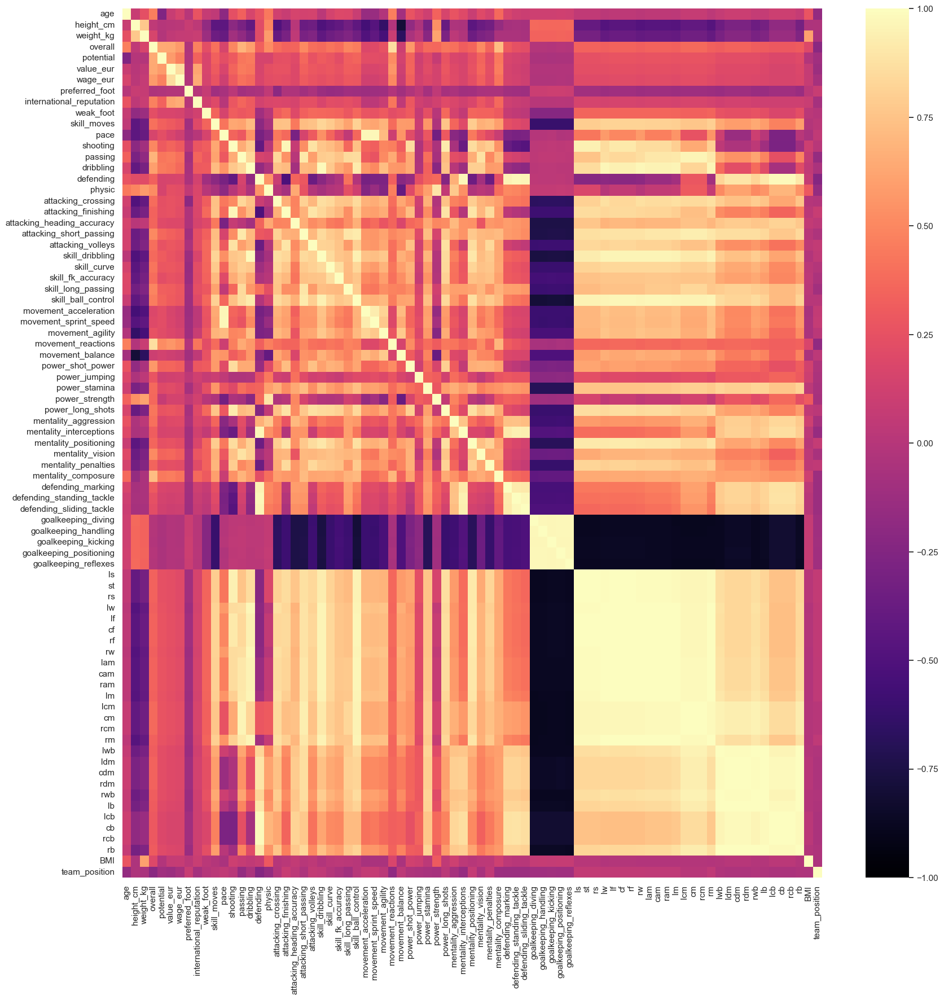

In [52]:
plt.figure(figsize=(20,20))
sns.heatmap(data_model.corr(), cmap = "magma" , vmin = -1, vmax = 1, center=0)

In [53]:
data_model.drop(['ls','st','rs','lw','lf','cf','rf','rw','lam','cam','ram','lm','lcm','cm','rcm','rm','lwb','ldm','cdm','rdm','rwb','lb','lcb','cb','rcb','rb'], axis=1, inplace=True)

<AxesSubplot:>

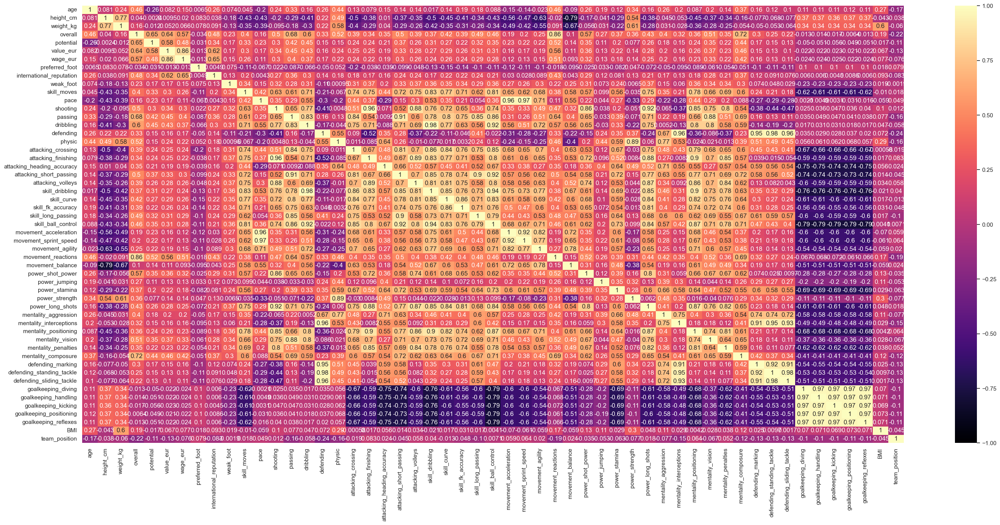

In [54]:
plt.figure(figsize=(35,15))
sns.heatmap(data_model.corr(),annot=True, cmap = "magma" , vmin = -1 , vmax = 1, center=0)

In [55]:
data_model.drop(['movement_acceleration', 'movement_sprint_speed', 'attacking_finishing', 'attacking_short_passing', 'skill_dribbling', 'skill_ball_control','power_long_shots', 'mentality_interceptions', 'mentality_positioning'], axis=1, inplace=True)

In [56]:
data_model.head()

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_heading_accuracy,attacking_volleys,skill_curve,skill_fk_accuracy,skill_long_passing,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,mentality_aggression,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,BMI,team_position
0,32,170,72,94,94,95500000,565000,0,5,4,4,87.0,92.0,92.0,96.0,39.0,66.0,88,70,88,93,94,92,93,95,95,86,68,75,68,48,94,75,96,33,37,26,6,11,15,14,8,24.913495,25
1,34,187,83,93,93,58500000,405000,1,5,4,5,90.0,93.0,82.0,89.0,35.0,78.0,84,89,87,81,76,77,87,96,71,95,95,85,78,63,82,85,95,28,32,24,7,11,15,14,11,23.735308,14
2,27,175,68,92,92,105500000,290000,1,5,5,5,91.0,85.0,87.0,95.0,32.0,58.0,87,62,87,88,87,81,96,92,84,80,61,81,49,51,90,90,94,27,26,29,9,9,15,15,11,22.204082,0
3,26,188,87,91,93,77500000,125000,1,3,3,1,NaN,NaN,NaN,NaN,NaN,NaN,13,15,13,13,14,40,67,88,49,59,78,41,78,34,65,11,68,27,12,18,87,92,78,90,89,24.615211,5
4,28,175,74,91,91,90000000,470000,1,4,4,4,91.0,83.0,86.0,94.0,35.0,66.0,81,61,83,83,79,83,95,90,94,82,56,84,63,54,89,88,91,34,27,22,11,12,6,8,8,24.163265,14


In [57]:
data_model.shape

(18278, 44)

In [58]:
data_model.isnull().sum().to_list()

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 2036,
 2036,
 2036,
 2036,
 2036,
 2036,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0]

**Treating Missing Values**

In [59]:
data_model.mean()

age                           2.528329e+01
height_cm                     1.813622e+02
weight_kg                     7.527634e+01
overall                       6.624499e+01
potential                     7.154689e+01
value_eur                     2.484038e+06
wage_eur                      9.456943e+03
preferred_foot                7.637597e-01
international_reputation      1.103184e+00
weak_foot                     2.944250e+00
skill_moves                   2.368038e+00
pace                          6.770090e+01
shooting                      5.229830e+01
passing                       5.723378e+01
dribbling                     6.253158e+01
defending                     5.155350e+01
physic                        6.487668e+01
attacking_crossing            4.971840e+01
attacking_heading_accuracy    5.222147e+01
attacking_volleys             4.280939e+01
skill_curve                   4.732569e+01
skill_fk_accuracy             4.270888e+01
skill_long_passing            5.276885e+01
movement_ag

In [60]:
data_model.fillna(data_model.mean(), inplace=True)

In [61]:
data_model.head()

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_heading_accuracy,attacking_volleys,skill_curve,skill_fk_accuracy,skill_long_passing,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,mentality_aggression,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,BMI,team_position
0,32,170,72,94,94,95500000,565000,0,5,4,4,87.000000,92.000000,92.000000,96.000000,39.000000,66.000000,88,70,88,93,94,92,93,95,95,86,68,75,68,48,94,75,96,33,37,26,6,11,15,14,8,24.913495,25
1,34,187,83,93,93,58500000,405000,1,5,4,5,90.000000,93.000000,82.000000,89.000000,35.000000,78.000000,84,89,87,81,76,77,87,96,71,95,95,85,78,63,82,85,95,28,32,24,7,11,15,14,11,23.735308,14
2,27,175,68,92,92,105500000,290000,1,5,5,5,91.000000,85.000000,87.000000,95.000000,32.000000,58.000000,87,62,87,88,87,81,96,92,84,80,61,81,49,51,90,90,94,27,26,29,9,9,15,15,11,22.204082,0
3,26,188,87,91,93,77500000,125000,1,3,3,1,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,13,15,13,13,14,40,67,88,49,59,78,41,78,34,65,11,68,27,12,18,87,92,78,90,89,24.615211,5
4,28,175,74,91,91,90000000,470000,1,4,4,4,91.000000,83.000000,86.000000,94.000000,35.000000,66.000000,81,61,83,83,79,83,95,90,94,82,56,84,63,54,89,88,91,34,27,22,11,12,6,8,8,24.163265,14


In [62]:
data_model.describe()

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_heading_accuracy,attacking_volleys,skill_curve,skill_fk_accuracy,skill_long_passing,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,mentality_aggression,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,BMI,team_position
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,0.763760,1.103184,2.944250,2.368038,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,49.718405,52.221468,42.809388,47.325692,42.708885,52.768848,63.504924,61.752544,63.856439,58.181694,64.928165,62.889485,65.234763,55.742149,53.609749,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924,22.858347,21.045082
std,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.424783,0.378861,0.664656,0.765038,10.649820,13.224936,9.811032,9.695186,15.477991,9.200490,18.325403,17.428429,17.701815,18.422991,17.433612,15.246454,14.808380,9.135613,14.201559,13.326083,11.934059,16.017954,12.534811,17.318157,13.955626,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125,1.366118,8.257360
min,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,0.000000,1.000000,1.000000,1.000000,24.000000,15.000000,24.000000,23.000000,15.000000,27.000000,5.000000,5.000000,3.000000,6.000000,4.000000,8.000000,11.000000,21.000000,12.000000,14.000000,19.000000,12.000000,20.000000,9.000000,9.000000,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,17.043303,0.000000
25%,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,1.000000,3.000000,2.000000,63.000000,44.000000,52.000000,58.000000,39.000000,60.000000,38.000000,44.000000,30.000000,34.000000,31.000000,43.000000,55.000000,56.000000,56.000000,48.000000,58.000000,56.000000,58.000000,44.000000,44.000000,39.000000,51.000000,29.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000,21.967858,17.000000
50%,25.000000,181.000000,75.000000,66.000000,71.000000,7.000000e+05,3000.000000,1.000000,1.000000,3.000000,2.000000,67.700899,52.298301,57.233777,62.531585,52.000000,64.876678,54.000000,56.000000,44.000000,49.000000,41.000000,56.000000,66.000000,62.000000,66.000000,59.000000,66.000000,66.000000,66.000000,58.000000,55.000000,49.000000,60.000000,52.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000,22.857143,23.000000
75%,29.000000,186.000000,80.000000,71.000000,75.000000,2.100000e+06,8000.000000,1.000000,1.000000,3.000000,3.000000,74.000000,62.000000,63.000000,69.000000,64.000000,71.000000,64.000000,64.000000,56.000000,62.000000,56.000000,64.000000,74.000000,68.000000,74.000000,68.000000,73.000000,74.000000,74.000000,69.000000,64.000000,60.000000,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000,23.719609,28.000000
max,42.000000,205.000000,110.000000,94.000000,95.000000,1.055000e+08,565000.000000,1.000000,5.000000,5.000000,5.0

In [63]:
data_model.isnull().sum()

age                           0
height_cm                     0
weight_kg                     0
overall                       0
potential                     0
value_eur                     0
wage_eur                      0
preferred_foot                0
international_reputation      0
weak_foot                     0
skill_moves                   0
pace                          0
shooting                      0
passing                       0
dribbling                     0
defending                     0
physic                        0
attacking_crossing            0
attacking_heading_accuracy    0
attacking_volleys             0
skill_curve                   0
skill_fk_accuracy             0
skill_long_passing            0
movement_agility              0
movement_reactions            0
movement_balance              0
power_shot_power              0
power_jumping                 0
power_stamina                 0
power_strength                0
mentality_aggression          0
mentalit

**Scaling The Data**

In [64]:
from sklearn import preprocessing 

In [65]:
scale = preprocessing.RobustScaler()

In [66]:
data_model_robust=scale.fit_transform(data_model)

In [67]:
data_model_robust_df=pd.DataFrame(data_model_robust)

In [68]:
data_model_robust_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 44 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       18278 non-null  float64
 1   1       18278 non-null  float64
 2   2       18278 non-null  float64
 3   3       18278 non-null  float64
 4   4       18278 non-null  float64
 5   5       18278 non-null  float64
 6   6       18278 non-null  float64
 7   7       18278 non-null  float64
 8   8       18278 non-null  float64
 9   9       18278 non-null  float64
 10  10      18278 non-null  float64
 11  11      18278 non-null  float64
 12  12      18278 non-null  float64
 13  13      18278 non-null  float64
 14  14      18278 non-null  float64
 15  15      18278 non-null  float64
 16  16      18278 non-null  float64
 17  17      18278 non-null  float64
 18  18      18278 non-null  float64
 19  19      18278 non-null  float64
 20  20      18278 non-null  float64
 21  21      18278 non-null  float64
 22

In [69]:
data_model_robust_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43
0,1.000000,-1.222222,-0.3,3.111111,2.875,53.408451,80.285714,-1.0,4.0,1.0,2.0,1.754464,2.205650,3.160566,3.042583,-0.52000,0.102120,1.307692,0.70,1.692308,1.571429,2.12,1.714286,1.421053,2.750000,1.611111,1.35,0.133333,0.500000,0.1250,-0.40,1.95,1.238095,2.2500,-0.542857,-0.461538,-0.650,-0.833333,0.000000,0.666667,0.500000,-0.5,1.173883,0.181818
1,1.285714,0.666667,0.8,3.000000,2.750,32.563380,57.428571,0.0,4.0,1.0,3.0,2.027191,2.261206,2.251475,2.406220,-0.68000,1.193029,1.153846,1.65,1.653846,1.142857,1.40,1.000000,1.105263,2.833333,0.277778,1.80,1.933333,1.055556,0.7500,0.20,1.35,1.714286,2.1875,-0.685714,-0.589744,-0.700,-0.666667,0.000000,0.666667,0.500000,0.0,0.501307,-0.818182
2,0.285714,-0.666667,-0.7,2.888889,2.625,59.042254,41.000000,0.0,4.0,2.0,3.0,2.118100,1.816761,2.706020,2.951674,-0.80000,-0.625153,1.269231,0.30,1.653846,1.392857,1.84,1.190476,1.578947,2.500000,1.000000,1.05,-0.333333,0.833333,-1.0625,-0.28,1.75,1.952381,2.1250,-0.714286,-0.743590,-0.575,-0.333333,-0.333333,0.666667,0.666667,0.0,-0.372805,-2.090909
3,0.142857,0.777778,1.2,2.777778,2.750,43.267606,17.428571,0.0,2.0,0.0,-1.0,0.000000,0.000000,0.000000,0.000000,-0.01786,0.000000,-1.576923,-2.05,-1.192308,-1.285714,-1.08,-0.761905,0.052632,2.166667,-0.944444,0.00,0.800000,-1.388889,0.7500,-0.96,0.50,-1.809524,0.5000,-0.714286,-1.102564,-0.850,12.666667,13.500000,11.166667,13.166667,13.0,1.003606,-1.636364
4,0.428571,-0.666667,-0.1,2.777778,2.500,50.309859,66.714286,0.0,3.0,1.0,2.0,2.118100,1.705650,2.615111,2.860765,-0.68000,0.102120,1.038462,0.25,1.500000,1.214286,1.52,1.285714,1.526316,2.333333,1.555556,1.15,-0.666667,1.000000,-0.1875,-0.16,1.70,1.857143,1.9375,-0.514286,-0.717949,-0.750,0.000000,0.166667,-0.833333,-0.500000,-0.5,0.745609,-0.818182


#### Dimentionality Reduction using Principal Component Analysis

In [70]:
from sklearn.decomposition import PCA
pca=PCA()

In [71]:
data_model_principal =pca.fit_transform(data_model_robust_df)

In [72]:
explained_variance=pca.explained_variance_ratio_
print(explained_variance)

[5.48710111e-01 2.43910626e-01 4.88945667e-02 3.42796484e-02
 1.76939779e-02 1.59360613e-02 1.15929407e-02 8.27725202e-03
 7.23268825e-03 6.11541205e-03 5.91044124e-03 4.56925823e-03
 4.03367592e-03 3.47107636e-03 3.24214444e-03 3.14084649e-03
 2.94446379e-03 2.86510611e-03 2.47912297e-03 2.24899001e-03
 2.07972339e-03 1.91622466e-03 1.85729536e-03 1.63045359e-03
 1.59522024e-03 1.43027972e-03 1.36627969e-03 1.30321978e-03
 1.23750204e-03 1.12355875e-03 1.04504995e-03 1.00150822e-03
 8.88962978e-04 8.36515856e-04 7.62772755e-04 5.89200019e-04
 4.66538667e-04 3.81399022e-04 3.25077962e-04 2.96175309e-04
 1.88619265e-04 8.53670635e-05 3.65635768e-05 8.08223662e-06]


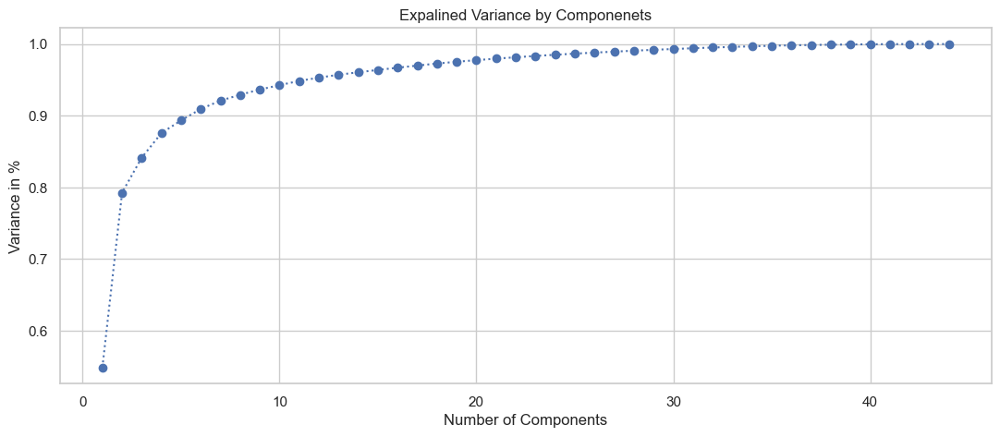

In [73]:
# Scree plot to get the optimum value of principal components
plt.figure(figsize=(13,5))
plt.plot(range(1,45), pca.explained_variance_ratio_.cumsum(), marker='o',linestyle='dotted')
plt.xlabel('Number of Components')
plt.ylabel('Variance in %') # for each component
plt.title('Expalined Variance by Componenets')
plt.show()

In [74]:
pca = PCA(n_components=3, random_state=42)
data_model_principal = pca.fit_transform(data_model_robust_df)
data_model_principal_df=pd.DataFrame(data_model_principal)

In [75]:
data_model_principal_df.columns = ['P1', 'P2', 'P3']

In [76]:
data_model_principal_df.head()

,P1,P2,P3
0,-9.334132,89.946452,11.887598
1,-7.095969,60.967977,8.014062
2,-7.508783,68.109135,4.517768
3,23.650463,43.038462,4.428189
4,-9.033266,78.566551,9.666410


### DBSCAN

In [77]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score

Before we apply the clustering algorithm we have to determine the appropriate epsilon level using the “Elbow Method”.

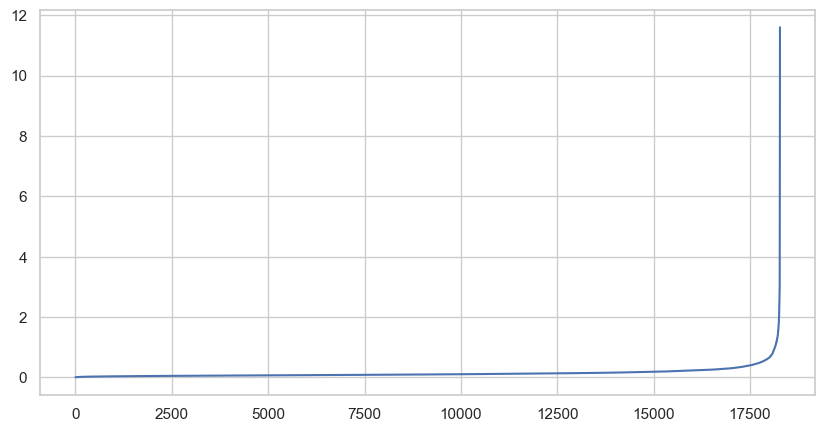

In [78]:
plt.figure(figsize=(10,5))
nn = NearestNeighbors(n_neighbors=5).fit(data_model_principal_df)
distances, idx = nn.kneighbors(data_model_principal_df)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)
plt.show()


It would seem the optimal epsilon value is around 1.0 to 1.5 . Finally, since we have 3 principal components to our data we’ll set our minimum points criteria to 6

In [79]:
from itertools import product
pca_eps_values = np.arange(1.0,1.6,0.1) 
pca_min_samples = np.arange(6,10) 
pca_dbscan_params = list(product(pca_eps_values, pca_min_samples))
pca_no_of_clusters = []
pca_sil_score = []
pca_epsvalues = []
pca_min_samp = []
for p in pca_dbscan_params:
    pca_dbscan_cluster = DBSCAN(eps=p[0], min_samples=p[1]).fit(data_model_principal_df)
    pca_epsvalues.append(p[0])
    pca_min_samp.append(p[1])
    pca_no_of_clusters.append(len(np.unique(pca_dbscan_cluster.labels_)))
    pca_sil_score.append(silhouette_score(data_model_principal_df, pca_dbscan_cluster.labels_))
pca_eps_min = list(zip(pca_no_of_clusters, pca_sil_score, pca_epsvalues, pca_min_samp))
pca_eps_min_df = pd.DataFrame(pca_eps_min, columns=['no_of_clusters', 'silhouette_score', 'epsilon_values', 'minimum_points'])

In [80]:
pd.set_option('display.max_rows', None)
pca_eps_min_df.sort_values(by= 'silhouette_score', axis=0, ignore_index=True, ascending=False)

,no_of_clusters,silhouette_score,epsilon_values,minimum_points
0,3,0.791864,1.4,7
1,3,0.791701,1.4,8
2,3,0.791607,1.5,9
3,3,0.791452,1.4,9
4,3,0.790959,1.3,7
5,4,0.777219,1.3,8
6,7,0.772742,1.1,6
7,7,0.760031,1.2,7
8,4,0.759903,1.6,8
9,4,0.759754,1.6,7


In [81]:
db_default=DBSCAN(eps=1.3, min_samples = 8).fit(data_model_principal_df)
labels = db_default.labels_

In [82]:
DBSCAN_dataset = data_model_principal_df.copy()
DBSCAN_dataset.loc[:,'Cluster'] = db_default.labels_ 

In [83]:
# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)
print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f" % 
      silhouette_score(data_model_principal_df, labels))

Estimated number of clusters: 3
Estimated number of noise points: 187
Silhouette Coefficient: 0.777


In [84]:
DBSCAN_dataset.head()

,P1,P2,P3,Cluster
0,-9.334132,89.946452,11.887598,-1
1,-7.095969,60.967977,8.014062,-1
2,-7.508783,68.109135,4.517768,-1
3,23.650463,43.038462,4.428189,-1
4,-9.033266,78.566551,9.666410,-1


In [104]:
# Players in Cluster 3
DBSCAN_dataset.Cluster.value_counts()

 1    16017
 2     2009
-1      187
 0       65
Name: Cluster, dtype: int64

In [86]:
data.head()

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,BMI,team_position
0,L. Messi,32,170,72,Argentina,FC Barcelona,94,94,95500000,565000,Left,5,4,4,195800000.0,87.0,92.0,92.0,96.0,39.0,66.0,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63,24.913495,RW
1,Cristiano Ronaldo,34,187,83,Portugal,Juventus,93,93,58500000,405000,Right,5,4,5,96500000.0,90.0,93.0,82.0,89.0,35.0,78.0,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61,23.735308,LW
2,Neymar Jr,27,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,Right,5,5,5,195200000.0,91.0,85.0,87.0,95.0,32.0,58.0,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84,84,84,90,89,89,89,90,90,90,90,89,82,82,82,89,66,61,61,61,66,61,46,46,46,61,22.204082,CAM
3,J. Oblak,26,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,Right,3,3,1,164700000.0,NaN,NaN,NaN,NaN,NaN,NaN,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24.615211,GK
4,E. Hazard,28,175,74,Belgium,Real Madrid,91,91,90000000,470000,Right,4,4,4,184500000.0,91.0,83.0,86.0,94.0,35.0,66.0,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83,83,83,89,88,88,88,89,89,89,89,89,83,83,83,89,66,63,63,63,66,61,49,49,49,61,24.163265,LW


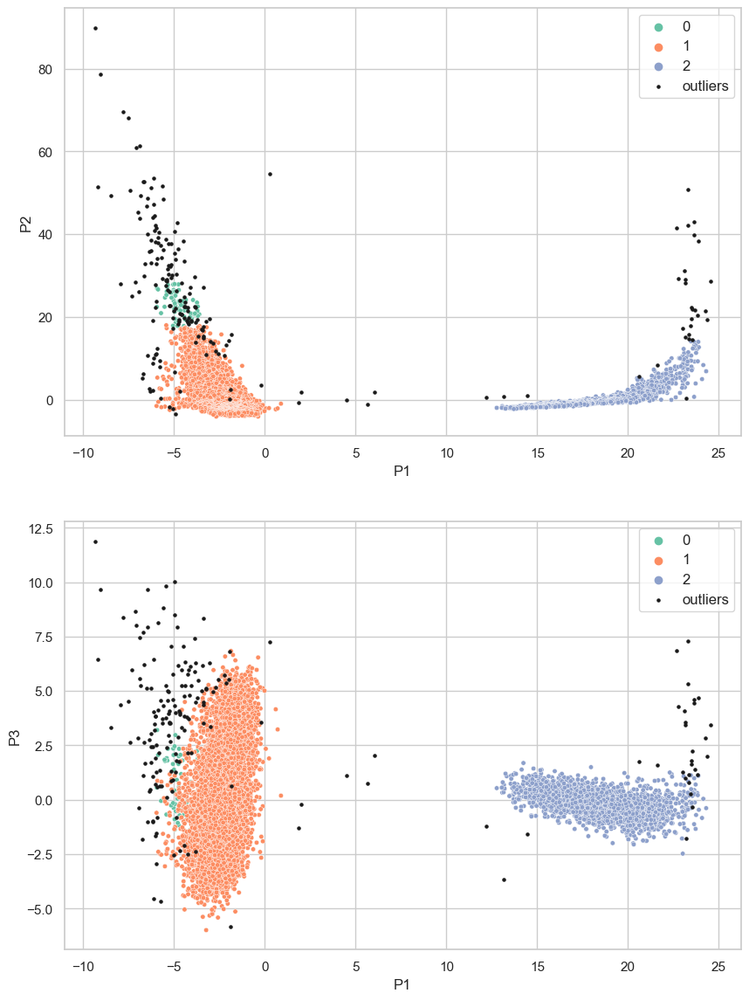

In [87]:
outliers = DBSCAN_dataset[DBSCAN_dataset['Cluster']==-1]

fig2, (axes) = plt.subplots(2,1,figsize=(10,14))

sns.scatterplot('P1', 'P2',

                data=DBSCAN_dataset[DBSCAN_dataset['Cluster']!=-1],

                hue='Cluster', ax=axes[0], palette='Set2', legend='full', s=15)

sns.scatterplot('P1', 'P3',

                data=DBSCAN_dataset[DBSCAN_dataset['Cluster']!=-1],

                hue='Cluster', palette='Set2', ax=axes[1], legend='full', s=15)

axes[0].scatter(outliers['P1'], outliers['P2'], s=5, label='outliers', c="k")

axes[1].scatter(outliers['P1'], outliers['P3'], s=5, label='outliers', c="k")
axes[0].legend()
axes[1].legend()

plt.setp(axes[0].get_legend().get_texts(), fontsize='12')
plt.setp(axes[1].get_legend().get_texts(), fontsize='12')

plt.show()

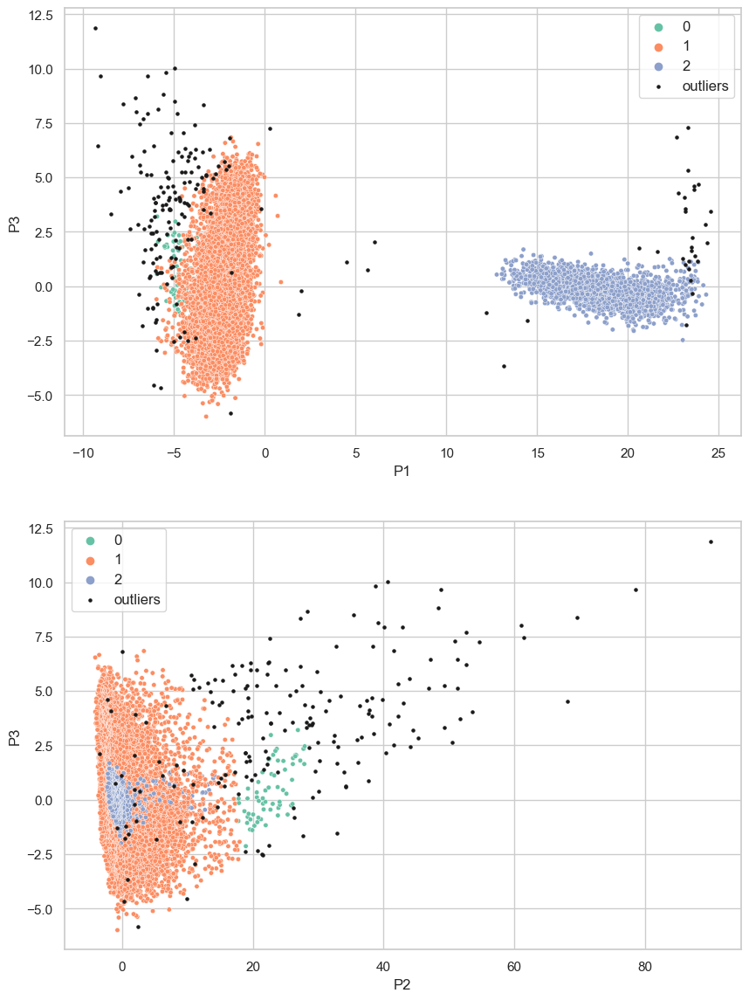

In [88]:
outliers = DBSCAN_dataset[DBSCAN_dataset['Cluster']==-1]

fig2, (axes) = plt.subplots(2,1,figsize=(10,14))

sns.scatterplot('P1', 'P3',

                data=DBSCAN_dataset[DBSCAN_dataset['Cluster']!=-1],

                hue='Cluster', ax=axes[0], palette='Set2', legend='full', s=15)

sns.scatterplot('P2', 'P3',

                data=DBSCAN_dataset[DBSCAN_dataset['Cluster']!=-1],

                hue='Cluster', palette='Set2', ax=axes[1], legend='full', s=15)

axes[0].scatter(outliers['P1'], outliers['P3'], s=5, label='outliers', c="k")

axes[1].scatter(outliers['P2'], outliers['P3'], s=5, label='outliers', c="k")
axes[0].legend()
axes[1].legend()

plt.setp(axes[0].get_legend().get_texts(), fontsize='12')
plt.setp(axes[1].get_legend().get_texts(), fontsize='12')

plt.show()

In [89]:
import plotly.offline as pyo
pyo.init_notebook_mode()
import plotly.graph_objs as go
from plotly import tools
from plotly.subplots import make_subplots
import plotly.offline as py
import plotly.express as px

In [90]:
Scene = dict(xaxis = dict(title  = 'P1'),yaxis = dict(title  = 'P2'),zaxis = dict(title  = 'P3'))
labels = db_default.labels_
trace = go.Scatter3d(x=DBSCAN_dataset.iloc[:,0], y=DBSCAN_dataset.iloc[:,1], z=DBSCAN_dataset.iloc[:,2], 
                     mode='markers', marker=dict(color = labels, colorscale='rainbow', 
                                                size = 3, line = dict(color = 'gray',width = 5)))
layout = go.Layout(scene = Scene, height =750,width = 1000)
dt2 = [trace]
fig = go.Figure(dt2, layout = layout)
fig.update_layout(title='DBSCAN for 5 clusters derived from PCA', font=dict(size=12,))
fig.show()

In [94]:
data=data.join(DBSCAN_dataset.Cluster)

In [95]:
data.head()

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,BMI,team_position,Cluster
0,L. Messi,32,170,72,Argentina,FC Barcelona,94,94,95500000,565000,Left,5,4,4,195800000.0,87.0,92.0,92.0,96.0,39.0,66.0,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63,24.913495,RW,-1
1,Cristiano Ronaldo,34,187,83,Portugal,Juventus,93,93,58500000,405000,Right,5,4,5,96500000.0,90.0,93.0,82.0,89.0,35.0,78.0,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61,23.735308,LW,-1
2,Neymar Jr,27,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,Right,5,5,5,195200000.0,91.0,85.0,87.0,95.0,32.0,58.0,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84,84,84,90,89,89,89,90,90,90,90,89,82,82,82,89,66,61,61,61,66,61,46,46,46,61,22.204082,CAM,-1
3,J. Oblak,26,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,Right,3,3,1,164700000.0,NaN,NaN,NaN,NaN,NaN,NaN,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24.615211,GK,-1
4,E. Hazard,28,175,74,Belgium,Real Madrid,91,91,90000000,470000,Right,4,4,4,184500000.0,91.0,83.0,86.0,94.0,35.0,66.0,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83,83,83,89,88,88,88,89,89,89,89,89,83,83,83,89,66,63,63,63,66,61,49,49,49,61,24.163265,LW,-1


In [96]:
# Players in Cluster 0
data_0 = data[data['Cluster']==0]
data_0.head()

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,BMI,team_position,Cluster
69,Parejo,30,182,74,Spain,Valencia CF,86,86,41000000,69000,Right,2,4,3,86100000.0,41.0,80.0,88.0,79.0,70.0,69.0,84,80,61,91,72,79,89,90,88,85,49,35,64,78,72,79,49,76,71,82,58,81,81,86,83,85,69,68,65,5,9,12,14,8,74,74,74,76,77,77,77,76,80,80,80,77,83,83,83,77,74,78,78,78,74,71,69,69,69,71,22.340297,RCM,0
71,C. Immobile,29,185,85,Italy,Lazio,86,86,44500000,105000,Right,3,4,3,75700000.0,80.0,85.0,63.0,81.0,39.0,76.0,55,87,81,74,85,83,70,51,49,83,76,83,75,87,63,86,77,79,73,80,77,40,91,65,78,81,34,33,32,6,8,15,12,6,83,83,83,79,82,82,82,79,78,78,78,76,70,70,70,76,60,57,57,57,60,57,54,54,54,57,24.835646,ST,0
78,S. Milinković-Savić,24,191,76,Serbia,Lazio,85,90,50500000,73000,Right,2,4,4,89600000.0,67.0,79.0,80.0,83.0,77.0,84.0,64,80,86,85,74,86,78,75,85,87,66,67,65,80,59,83,85,85,88,80,73,78,79,85,56,82,75,77,72,7,10,7,16,7,81,81,81,78,81,81,81,78,82,82,82,79,83,83,83,79,76,80,80,80,76,76,79,79,79,76,20.832762,RDM,0
80,Saúl,24,184,77,Spain,Atlético Madrid,85,89,49500000,77000,Left,3,4,3,105200000.0,70.0,78.0,79.0,81.0,78.0,78.0,69,78,83,85,76,81,72,60,83,85,71,70,73,82,69,82,78,87,77,81,69,79,82,82,55,83,77,78,77,7,13,12,10,9,80,80,80,79,80,80,80,79,81,81,81,79,82,82,82,79,78,80,80,80,78,78,78,78,78,78,22.743384,LCM,0
82,A. Robertson,25,178,64,Scotland,Liverpool,85,89,43500000,125000,Left,1,2,3,83700000.0,85.0,62.0,77.0,79.0,80.0,75.0,89,57,63,79,32,78,78,30,71,81,83,86,78,84,74,74,62,94,65,65,80,82,76,77,55,79,81,83,80,11,8,10,7,14,71,71,71,77,76,76,76,77,76,76,76,79,78,78,78,79,83,80,80,80,83,82,77,77,77,82,20.199470,LB,0


In [97]:
# Players in Cluster 3
data_1 = data[data['Cluster']==1]
data_1.head()

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,BMI,team_position,Cluster
96,Z. Ibrahimović,37,195,95,Sweden,LA Galaxy,85,85,14000000,15000,Right,5,4,5,21000000.0,56.0,88.0,77.0,77.0,34.0,78.0,70,86,83,77,88,77,80,78,73,84,57,55,72,82,39,90,68,59,87,88,84,20,91,84,89,90,28,37,24,13,15,10,9,12,82,82,82,77,80,80,80,77,80,80,80,75,74,74,74,75,53,57,57,57,53,50,52,52,52,50,24.983563,ST,1
104,Iago Aspas,31,176,67,Spain,RC Celta,85,85,34500000,49000,Left,2,3,3,72500000.0,78.0,84.0,77.0,85.0,35.0,64.0,80,88,78,79,83,86,80,76,68,85,80,76,87,85,72,79,66,71,60,82,63,39,86,79,82,85,39,21,18,12,16,9,12,13,82,82,82,83,83,83,83,83,82,82,82,81,74,74,74,81,60,57,57,57,60,56,49,49,49,56,21.629649,RS,1
124,Alex Telles,26,181,71,Brazil,FC Porto,84,86,33000000,23000,Left,3,2,3,68500000.0,85.0,72.0,84.0,81.0,80.0,76.0,89,65,74,84,67,82,87,79,87,83,84,85,73,83,70,80,80,91,68,76,78,80,76,76,81,80,80,81,79,13,8,12,11,14,76,76,76,80,79,79,79,80,79,79,79,82,81,81,81,82,83,81,81,81,83,82,78,78,78,82,21.672110,LB,1
128,Pepe,36,188,81,Portugal,FC Porto,84,84,6500000,16000,Right,4,3,2,13000000.0,67.0,51.0,57.0,60.0,85.0,85.0,46,46,82,71,23,58,44,47,61,62,64,70,63,82,48,63,88,82,83,56,92,84,40,48,57,79,86,85,82,8,15,5,9,10,60,60,60,58,59,59,59,58,59,59,59,60,64,64,64,60,73,76,76,76,73,75,82,82,82,75,22.917610,RCB,1
132,M. Hamšík,31,183,73,Slovakia,Dalian YiFang FC,84,84,26500000,26000,Right,3,5,3,41100000.0,69.0,77.0,83.0,83.0,72.0,69.0,78,74,74,86,77,84,80,70,83,85,70,68,77,88,67,82,70,81,67,78,60,72,85,86,70,84,75,70,62,8,6,4,14,14,79,79,79,80,81,81,81,80,82,82,82,81,83,83,83,81,76,77,77,77,76,74,71,71,71,74,21.798202,CAM,1


In [98]:
# Players in Cluster 3
data_2 = data[data['Cluster']==2]
data_2.head()

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,BMI,team_position,Cluster
125,J. Pavlenka,27,196,81,Czech Republic,SV Werder Bremen,84,86,26000000,37000,Right,1,3,1,46200000.0,NaN,NaN,NaN,NaN,NaN,NaN,11,16,14,28,19,12,10,14,17,19,35,37,39,82,27,53,36,20,68,17,22,13,14,25,18,39,12,10,14,86,79,70,80,88,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,21.084965,GK,2
130,S. Ruffier,32,188,93,France,AS Saint-Étienne,84,84,19000000,41000,Right,3,3,1,36100000.0,NaN,NaN,NaN,NaN,NaN,NaN,11,11,12,33,13,12,17,12,34,15,45,50,51,79,55,56,72,37,76,11,31,25,12,49,25,66,13,12,11,82,84,75,85,82,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,26.312811,GK,2
131,S. Sirigu,32,192,80,Italy,Torino,84,84,19000000,54000,Right,3,2,1,32300000.0,NaN,NaN,NaN,NaN,NaN,NaN,13,10,11,23,12,15,11,11,28,18,50,51,52,79,55,57,68,34,66,14,34,20,10,55,19,62,14,11,13,84,80,76,84,82,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,21.701389,GK,2
137,Y. Sommer,30,183,79,Switzerland,Borussia Mönchengladbach,84,84,21000000,37000,Right,3,4,1,35700000.0,NaN,NaN,NaN,NaN,NaN,NaN,13,13,10,40,8,15,12,13,31,25,48,54,55,81,58,61,73,45,68,12,38,21,15,58,24,57,9,19,12,79,85,81,80,87,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,23.589835,GK,2
184,K. Casteels,27,197,86,Belgium,VfL Wolfsburg,83,85,22000000,50000,Left,2,2,1,39100000.0,NaN,NaN,NaN,NaN,NaN,NaN,15,15,14,35,13,14,20,13,37,23,44,46,50,82,43,59,58,44,72,18,33,16,15,42,20,40,11,19,17,83,79,79,82,83,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,22.159808,GK,2


In [99]:
# Players in Cluster -1. Outliers
data_minus_1 = data[data['Cluster']==-1]
data_minus_1.head()

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,BMI,team_position,Cluster
0,L. Messi,32,170,72,Argentina,FC Barcelona,94,94,95500000,565000,Left,5,4,4,195800000.0,87.0,92.0,92.0,96.0,39.0,66.0,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63,24.913495,RW,-1
1,Cristiano Ronaldo,34,187,83,Portugal,Juventus,93,93,58500000,405000,Right,5,4,5,96500000.0,90.0,93.0,82.0,89.0,35.0,78.0,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61,23.735308,LW,-1
2,Neymar Jr,27,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,Right,5,5,5,195200000.0,91.0,85.0,87.0,95.0,32.0,58.0,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84,84,84,90,89,89,89,90,90,90,90,89,82,82,82,89,66,61,61,61,66,61,46,46,46,61,22.204082,CAM,-1
3,J. Oblak,26,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,Right,3,3,1,164700000.0,NaN,NaN,NaN,NaN,NaN,NaN,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,24.615211,GK,-1
4,E. Hazard,28,175,74,Belgium,Real Madrid,91,91,90000000,470000,Right,4,4,4,184500000.0,91.0,83.0,86.0,94.0,35.0,66.0,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,83,83,83,89,88,88,88,89,89,89,89,89,83,83,83,89,66,63,63,63,66,61,49,49,49,61,24.163265,LW,-1


<AxesSubplot:xlabel='Cluster', ylabel='wage_eur'>

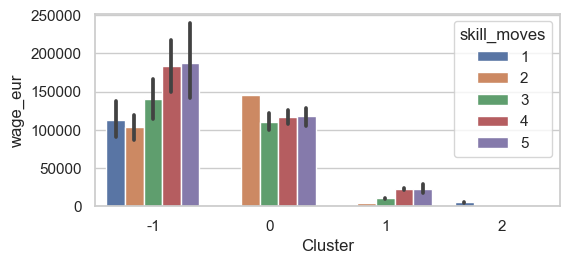

In [100]:
sns.barplot(data=data, y="wage_eur", x="Cluster", hue='skill_moves')

<AxesSubplot:xlabel='Cluster', ylabel='potential'>

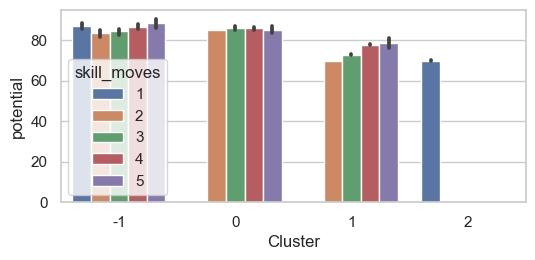

In [101]:
sns.barplot(data=data, y="potential", x="Cluster", hue='skill_moves')

<AxesSubplot:xlabel='age', ylabel='potential'>

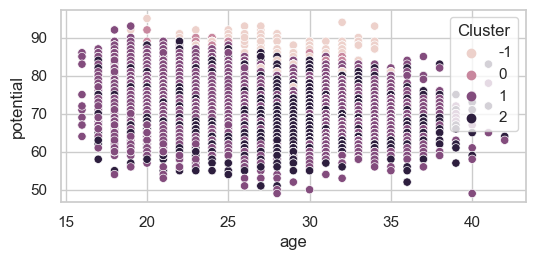

In [102]:
sns.scatterplot(data=data, y="potential", x="age", hue='Cluster')

In [103]:
Scene = dict(xaxis = dict(title  = 'wage_eur'),yaxis = dict(title  = 'potential'),zaxis = dict(title  = 'Age'))
trace = go.Scatter3d(x=data.wage_eur, y=data.potential, z=data.age, 
                     mode='markers',marker=dict(color = data.Cluster, colorscale='rainbow', 
                                                size = 3, line = dict(color = 'gray',width = 5)))
layout = go.Layout(scene = Scene, height = 750,width = 1000)
dt2 = [trace]
fig = go.Figure(dt2, layout = layout)
fig.update_layout(title='Comparison', font=dict(size=12,))
fig.show()